In [ ]:
import warnings
warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np
import seaborn as sns
from sklearn import preprocessing
import datetime

import plotly.express as px 
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline

import altair as alt
import requests
import sys


# Recolección y unión de los datos


In [ ]:
url = 'https://docs.google.com/spreadsheets/d/16-bnsDdmmgtSxdWbVMboIHo5FRuz76DBxsz_BbsEVWA/export?format=csv&id=16-bnsDdmmgtSxdWbVMboIHo5FRuz76DBxsz_BbsEVWA&gid=0'
df_historico = pd.read_csv(url)
df_historico.sample(5)

,fecha,dia_inicio,dia_cuarentena_dnu260,osm_admin_level_2,osm_admin_level_4,osm_admin_level_8,tot_casosconf,nue_casosconf_diff,tot_fallecidos,nue_fallecidos_diff,tot_recuperados,tot_terapia,test_RT-PCR_negativos,test_RT-PCR_total,transmision_tipo,informe_tipo,informe_link,observacion,covid19argentina_admin_level_4
283,5/04/2020,32,16.0,Argentina,CABA,NaN,1517,32,49,0,NaN,NaN,NaN,NaN,transmision comunitaria,NaN,https://www.argentina.gob.ar/sites/default/fil...,NaN,capital-federal
272,4/04/2020,31,15.0,Argentina,Neuquén,NaN,1431,4,48,0,NaN,NaN,NaN,NaN,transmision comunitaria,NaN,https://www.argentina.gob.ar/sites/default/fil...,NaN,neuquen
1630,25/06/2020,113,97.0,Argentina,Corrientes,NaN,52343,0,1147,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1319,12/06/2020,100,84.0,Argentina,Córdoba,NaN,28735,9,785,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3700,16/09/2020,196,180.0,Argentina,Formosa,NaN,585297,-2,12069,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
df_historico.fillna(0).head()

,fecha,dia_inicio,dia_cuarentena_dnu260,osm_admin_level_2,osm_admin_level_4,osm_admin_level_8,tot_casosconf,nue_casosconf_diff,tot_fallecidos,nue_fallecidos_diff,tot_recuperados,tot_terapia,test_RT-PCR_negativos,test_RT-PCR_total,transmision_tipo,informe_tipo,informe_link,observacion,covid19argentina_admin_level_4
0,2/03/2020,1,0.0,Argentina,CABA,0,1,1,0,0,0,0.0,0.0,0.0,importado,0,https://www.infobae.com/coronavirus/2020/03/03...,no hay informe,capital-federal
1,3/03/2020,2,0.0,Argentina,Indeterminado,0,1,0,0,0,0,0.0,0.0,0.0,importado,0,0,no hay informe,no-data
2,4/03/2020,3,0.0,Argentina,Indeterminado,0,1,0,0,0,0,0.0,0.0,0.0,importado,0,0,no hay informe,no-data
3,5/03/2020,4,0.0,Argentina,Buenos Aires,0,2,1,2,2,0,0.0,0.0,0.0,importado,informe nacional,https://www.argentina.gob.ar/sites/default/fil...,0,buenos-aires
4,6/03/2020,5,0.0,Argentina,Indeterminado,0,2,0,2,0,0,0.0,0.0,0.0,importado,informe nacional,https://www.argentina.gob.ar/sites/default/fil...,0,no-data


In [ ]:
df_historico = df_historico[['fecha','osm_admin_level_4','nue_casosconf_diff','nue_fallecidos_diff']]
df_historico.head()

,fecha,osm_admin_level_4,nue_casosconf_diff,nue_fallecidos_diff
0,2/03/2020,CABA,1,0
1,3/03/2020,Indeterminado,0,0
2,4/03/2020,Indeterminado,0,0
3,5/03/2020,Buenos Aires,1,2
4,6/03/2020,Indeterminado,0,0


In [ ]:
# Deleting Indeterminate and NA (sure indeterminado is not transformed in NA?)
df_historico.drop(df_historico[df_historico.osm_admin_level_4 == 'Indeterminado'].index, inplace=True)
df_historico.drop(df_historico[df_historico.osm_admin_level_4.isna()].index, inplace=True)
df_historico.head()

,fecha,osm_admin_level_4,nue_casosconf_diff,nue_fallecidos_diff
0,2/03/2020,CABA,1,0
3,5/03/2020,Buenos Aires,1,2
6,8/03/2020,Buenos Aires,8,0
7,9/03/2020,CABA,1,1
8,9/03/2020,San Luis,2,0


In [ ]:
df_historico.fecha = pd.to_datetime(df_historico.fecha.astype(str), format='%d/%m/%Y')


In [ ]:
df_historico.rename(columns={
    'fecha':'index',
    'osm_admin_level_4':'Province/State'
}, inplace=True)

In [ ]:
df_historico.head()

,index,Province/State,nue_casosconf_diff,nue_fallecidos_diff
0,2020-03-02,CABA,1,0
3,2020-03-05,Buenos Aires,1,2
6,2020-03-08,Buenos Aires,8,0
7,2020-03-09,CABA,1,1
8,2020-03-09,San Luis,2,0


In [ ]:
df_historico.sort_values(by=['Province/State', 'index'], ascending=True)

,index,Province/State,nue_casosconf_diff,nue_fallecidos_diff
3,2020-03-05,Buenos Aires,1,2
6,2020-03-08,Buenos Aires,8,0
11,2020-03-10,Buenos Aires,1,0
13,2020-03-11,Buenos Aires,1,0
16,2020-03-13,Buenos Aires,1,0
23,2020-03-15,Buenos Aires,1,0
26,2020-03-16,Buenos Aires,1,0
28,2020-03-17,Buenos Aires,1,0
40,2020-03-18,Buenos Aires,6,0
44,2020-03-19,Buenos Aires,14,0


In [ ]:
df_deaths = df_historico[['index','Province/State','nue_fallecidos_diff']]
df_confirmed = df_historico[['index','Province/State','nue_casosconf_diff']]

In [ ]:
df_deaths.head()

,index,Province/State,nue_fallecidos_diff
0,2020-03-02,CABA,0
3,2020-03-05,Buenos Aires,2
6,2020-03-08,Buenos Aires,0
7,2020-03-09,CABA,1
8,2020-03-09,San Luis,0


In [ ]:
df_confirmed.head()

,index,Province/State,nue_casosconf_diff
0,2020-03-02,CABA,1
3,2020-03-05,Buenos Aires,1
6,2020-03-08,Buenos Aires,8
7,2020-03-09,CABA,1
8,2020-03-09,San Luis,2


In [ ]:
df_confirmed.groupby(['index','Province/State'])['nue_casosconf_diff'].sum().reset_index()

,index,Province/State,nue_casosconf_diff
0,2020-03-02,CABA,1
1,2020-03-05,Buenos Aires,1
2,2020-03-08,Buenos Aires,8
3,2020-03-09,CABA,1
4,2020-03-09,Chaco,5
5,2020-03-09,Río Negro,1
6,2020-03-09,San Luis,2
7,2020-03-10,Buenos Aires,1
8,2020-03-10,CABA,1
9,2020-03-11,Buenos Aires,1


In [ ]:
df_confirmed.sample(5)

,index,Province/State,nue_casosconf_diff
3570,2020-09-11,Chaco,125
1365,2020-06-14,Córdoba,6
820,2020-05-17,Córdoba,20
2843,2020-08-13,CABA,1120
2014,2020-07-10,Tierra del Fuego,0


In [ ]:
df_confirmed_pivot = pd.pivot_table(df_confirmed, values='nue_casosconf_diff', index=['Province/State'], columns='index', aggfunc=np.sum).fillna(0)
df_confirmed_pivot.sample(5)

index,2020-03-02,2020-03-05,2020-03-08,2020-03-09,2020-03-10,2020-03-11,2020-03-12,2020-03-13,2020-03-14,2020-03-15,2020-03-16,2020-03-17,2020-03-18,2020-03-19,2020-03-20,2020-03-21,2020-03-22,2020-03-23,2020-03-24,2020-03-25,2020-03-26,2020-03-27,2020-03-28,2020-03-29,2020-03-30,2020-03-31,2020-04-01,2020-04-02,2020-04-03,2020-04-04,2020-04-05,2020-04-06,2020-04-07,2020-04-08,2020-04-09,2020-04-10,2020-04-11,2020-04-12,2020-04-13,2020-04-14,...,2020-08-12,2020-08-13,2020-08-14,2020-08-15,2020-08-16,2020-08-17,2020-08-18,2020-08-19,2020-08-20,2020-08-21,2020-08-22,2020-08-23,2020-08-24,2020-08-25,2020-08-26,2020-08-27,2020-08-28,2020-08-29,2020-08-30,2020-08-31,2020-09-01,2020-09-02,2020-09-03,2020-09-04,2020-09-05,2020-09-06,2020-09-07,2020-09-08,2020-09-09,2020-09-10,2020-09-11,2020-09-12,2020-09-13,2020-09-14,2020-09-15,2020-09-16,2020-09-17,2020-09-18,2020-09-19,2020-09-20
Province/State,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
San Luis,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,1.0,0.0,0.0,0.0,2.0,0.0,3.0,0.0,2.0,2.0,-2.0,-1.0,4.0,7.0,10.0,25.0,-1.0,62.0,9.0,21.0,18.0,15.0,35.0,2.0,60.0,18.0,21.0,10.0,23.0,3.0,1.0,49.0,51.0,25.0,62.0,78.0,24.0,26.0
Mendoza,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,3.0,2.0,10.0,0.0,2.0,0.0,2.0,1.0,2.0,6.0,2.0,9.0,5.0,3.0,2.0,3.0,...,189.0,164.0,165.0,210.0,210.0,169.0,124.0,150.0,267.0,212.0,245.0,140.0,172.0,264.0,276.0,252.0,342.0,290.0,316.0,281.0,361.0,413.0,544.0,653.0,483.0,413.0,623.0,516.0,798.0,731.0,695.0,718.0,704.0,650.0,629.0,682.0,566.0,578.0,673.0,590.0
Neuquén,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,3.0,4.0,2.0,0.0,8.0,0.0,4.0,4.0,1.0,4.0,11.0,6.0,3.0,17.0,7.0,7.0,1.0,1.0,2.0,2.0,...,155.0,65.0,16.0,72.0,27.0,64.0,13.0,50.0,59.0,47.0,103.0,108.0,15.0,122.0,132.0,122.0,99.0,77.0,87.0,104.0,136.0,91.0,135.0,73.0,171.0,177.0,140.0,90.0,69.0,180.0,161.0,67.0,286.0,227.0,120.0,189.0,218.0,150.0,141.0,155.0
Jujuy,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,152.0,170.0,133.0,157.0,272.0,244.0,218.0,133.0,264.0,250.0,212.0,185.0,352.0,215.0,236.0,200.0,347.0,321.0,149.0,327.0,124.0,318.0,357.0,332.0,326.0,250.0,355.0,294.0,343.0,280.0,302.0,254.0,169.0,277.0,331.0,305.0,309.0,256.0,295.0,255.0
Santa Cruz,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,2.0,0.0,0.0,0.0,0.0,0.0,10.0,2.0,0.0,1.0,1.0,0.0,8.0,0.0,0.0,6.0,3.0,0.0,0.0,0.0,...,34.0,49.0,40.0,38.0,42.0,33.0,22.0,56.0,33.0,68.0,47.0,41.0,44.0,38.0,63.0,51.0,88.0,32.0,84.0,37.0,37.0,107.0,47.0,67.0,138.0,121.0,34.0,76.0,142.0,86.0,136.0,114.0,193.0,39.0,84.0,84.0,86.0,107.0,195.0,83.0


In [ ]:
df_deaths_pivot = pd.pivot_table(df_deaths, values='nue_fallecidos_diff',
                                 index=['Province/State'], columns='index', aggfunc=np.sum).fillna(0)
df_deaths_pivot.sample(5)

index,2020-03-02,2020-03-05,2020-03-08,2020-03-09,2020-03-10,2020-03-11,2020-03-12,2020-03-13,2020-03-14,2020-03-15,2020-03-16,2020-03-17,2020-03-18,2020-03-19,2020-03-20,2020-03-21,2020-03-22,2020-03-23,2020-03-24,2020-03-25,2020-03-26,2020-03-27,2020-03-28,2020-03-29,2020-03-30,2020-03-31,2020-04-01,2020-04-02,2020-04-03,2020-04-04,2020-04-05,2020-04-06,2020-04-07,2020-04-08,2020-04-09,2020-04-10,2020-04-11,2020-04-12,2020-04-13,2020-04-14,...,2020-08-12,2020-08-13,2020-08-14,2020-08-15,2020-08-16,2020-08-17,2020-08-18,2020-08-19,2020-08-20,2020-08-21,2020-08-22,2020-08-23,2020-08-24,2020-08-25,2020-08-26,2020-08-27,2020-08-28,2020-08-29,2020-08-30,2020-08-31,2020-09-01,2020-09-02,2020-09-03,2020-09-04,2020-09-05,2020-09-06,2020-09-07,2020-09-08,2020-09-09,2020-09-10,2020-09-11,2020-09-12,2020-09-13,2020-09-14,2020-09-15,2020-09-16,2020-09-17,2020-09-18,2020-09-19,2020-09-20
Province/State,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Neuquén,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,1.0,2.0,1.0,1.0,2.0,0.0,0.0,2.0,1.0,0.0,3.0,3.0,0.0,1.0,2.0,3.0,0.0,3.0,1.0,1.0,4.0,4.0,3.0,2.0,2.0,1.0,0.0,4.0,2.0,1.0,1.0,7.0,6.0,3.0,4.0
Chaco,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,...,0.0,6.0,0.0,4.0,3.0,4.0,3.0,1.0,2.0,2.0,0.0,0.0,4.0,1.0,4.0,1.0,2.0,2.0,3.0,6.0,0.0,0.0,3.0,2.0,1.0,3.0,1.0,3.0,2.0,1.0,2.0,3.0,2.0,3.0,2.0,0.0,3.0,4.0,1.0,5.0
Buenos Aires,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,2.0,1.0,1.0,0.0,2.0,0.0,2.0,2.0,3.0,1.0,1.0,2.0,4.0,1.0,6.0,1.0,4.0,4.0,1.0,2.0,...,142.0,73.0,88.0,83.0,29.0,59.0,133.0,209.0,104.0,132.0,77.0,104.0,276.0,121.0,187.0,142.0,144.0,41.0,37.0,124.0,177.0,109.0,183.0,176.0,70.0,69.0,140.0,184.0,154.0,141.0,127.0,54.0,38.0,159.0,100.0,165.0,213.0,92.0,56.0,117.0
Santa Fe,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,1.0,3.0,1.0,1.0,0.0,1.0,2.0,2.0,2.0,6.0,4.0,3.0,7.0,5.0,4.0,4.0,4.0,1.0,2.0,10.0,6.0,3.0,5.0,7.0,6.0,11.0,12.0,7.0,7.0,21.0,10.0,8.0,2.0,16.0,7.0,17.0,16.0,10.0,4.0,5.0
Tierra del Fuego,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,3.0,2.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,2.0,0.0,2.0,2.0,0.0,1.0,0.0,2.0,1.0,3.0,2.0,1.0,0.0,0.0,1.0,1.0,1.0,3.0,1.0,2.0,0.0,2.0,2.0,1.0,0.0,1.0


In [ ]:
df_confirmed_pivot.columns = df_confirmed_pivot.columns.strftime('%-m/%-d/%y')
df_deaths_pivot.columns = df_deaths_pivot.columns.strftime('%-m/%-d/%y')

In [ ]:
df_confirmed_pivot.insert(0, 'Country/Region', 'Argentina')
df_deaths_pivot.insert(0, 'Country/Region', 'Argentina')

In [ ]:
df_confirmed_pivot.head() # It is not sequentially ordered

index,Country/Region,3/2/20,3/5/20,3/8/20,3/9/20,3/10/20,3/11/20,3/12/20,3/13/20,3/14/20,3/15/20,3/16/20,3/17/20,3/18/20,3/19/20,3/20/20,3/21/20,3/22/20,3/23/20,3/24/20,3/25/20,3/26/20,3/27/20,3/28/20,3/29/20,3/30/20,3/31/20,4/1/20,4/2/20,4/3/20,4/4/20,4/5/20,4/6/20,4/7/20,4/8/20,4/9/20,4/10/20,4/11/20,4/12/20,4/13/20,...,8/12/20,8/13/20,8/14/20,8/15/20,8/16/20,8/17/20,8/18/20,8/19/20,8/20/20,8/21/20,8/22/20,8/23/20,8/24/20,8/25/20,8/26/20,8/27/20,8/28/20,8/29/20,8/30/20,8/31/20,9/1/20,9/2/20,9/3/20,9/4/20,9/5/20,9/6/20,9/7/20,9/8/20,9/9/20,9/10/20,9/11/20,9/12/20,9/13/20,9/14/20,9/15/20,9/16/20,9/17/20,9/18/20,9/19/20,9/20/20
Province/State,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Buenos Aires,Argentina,0.0,1.0,8.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,6.0,14.0,9.0,14.0,8.0,5.0,29.0,30.0,27.0,36.0,8.0,16.0,36.0,17.0,10.0,36.0,22.0,26.0,33.0,12.0,34.0,17.0,28.0,19.0,37.0,28.0,29.0,...,5153.0,4983.0,4157.0,4438.0,3117.0,2521.0,4585.0,4303.0,5245.0,5322.0,4838.0,2829.0,5656.0,5312.0,6628.0,6402.0,7486.0,5545.0,3887.0,5141.0,6157.0,6235.0,6990.0,5682.0,5320.0,3269.0,4633.0,6909.0,6266.0,6252.0,5732.0,5862.0,3689.0,4863.0,6001.0,6078.0,6319.0,5708.0,3877.0,3645.0
CABA,Argentina,1.0,0.0,0.0,1.0,1.0,1.0,10.0,2.0,11.0,6.0,5.0,4.0,10.0,8.0,9.0,29.0,11.0,11.0,29.0,21.0,30.0,27.0,18.0,13.0,34.0,19.0,10.0,24.0,28.0,34.0,32.0,17.0,24.0,18.0,23.0,11.0,46.0,8.0,10.0,...,1163.0,1120.0,1012.0,915.0,972.0,710.0,1051.0,1094.0,1280.0,1179.0,1100.0,1020.0,1333.0,1311.0,1568.0,1220.0,1430.0,1195.0,1235.0,1387.0,1395.0,1346.0,1411.0,1278.0,1084.0,802.0,1089.0,1300.0,1264.0,1284.0,1215.0,985.0,843.0,946.0,1010.0,813.0,1156.0,1070.0,683.0,696.0
Catamarca,Argentina,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,2.0,-1.0,-1.0,1.0,-1.0,1.0,-1.0,1.0,0.0,-1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,3.0,1.0,10.0,5.0,2.0,8.0,3.0,12.0,3.0,6.0,4.0,5.0,4.0,21.0,23.0,6.0,7.0,1.0
Chaco,Argentina,0.0,0.0,0.0,5.0,0.0,0.0,0.0,0.0,0.0,4.0,3.0,1.0,1.0,2.0,1.0,5.0,7.0,4.0,9.0,12.0,3.0,3.0,5.0,4.0,12.0,3.0,12.0,3.0,8.0,8.0,0.0,4.0,4.0,15.0,6.0,5.0,0.0,1.0,3.0,...,64.0,61.0,49.0,40.0,68.0,68.0,45.0,57.0,95.0,55.0,78.0,27.0,53.0,53.0,74.0,63.0,79.0,98.0,61.0,75.0,75.0,84.0,106.0,89.0,141.0,102.0,42.0,94.0,140.0,128.0,125.0,117.0,91.0,41.0,87.0,122.0,108.0,104.0,132.0,65.0
Chubut,Argentina,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,10.0,18.0,6.0,4.0,9.0,14.0,7.0,13.0,18.0,19.0,36.0,24.0,12.0,35.0,69.0,49.0,66.0,43.0,12.0,79.0,56.0,28.0,79.0,39.0,77.0,39.0,57.0,48.0,39.0,29.0,90.0,165.0,73.0,39.0,98.0,94.0,95.0,56.0,81.0,126.0


In [ ]:
df_confirmed_pivot = df_confirmed_pivot.reset_index()
df_deaths_pivot = df_deaths_pivot.reset_index()

In [ ]:
df_confirmed_pivot.sample(5)

index,Province/State,Country/Region,3/2/20,3/5/20,3/8/20,3/9/20,3/10/20,3/11/20,3/12/20,3/13/20,3/14/20,3/15/20,3/16/20,3/17/20,3/18/20,3/19/20,3/20/20,3/21/20,3/22/20,3/23/20,3/24/20,3/25/20,3/26/20,3/27/20,3/28/20,3/29/20,3/30/20,3/31/20,4/1/20,4/2/20,4/3/20,4/4/20,4/5/20,4/6/20,4/7/20,4/8/20,4/9/20,4/10/20,4/11/20,4/12/20,...,8/12/20,8/13/20,8/14/20,8/15/20,8/16/20,8/17/20,8/18/20,8/19/20,8/20/20,8/21/20,8/22/20,8/23/20,8/24/20,8/25/20,8/26/20,8/27/20,8/28/20,8/29/20,8/30/20,8/31/20,9/1/20,9/2/20,9/3/20,9/4/20,9/5/20,9/6/20,9/7/20,9/8/20,9/9/20,9/10/20,9/11/20,9/12/20,9/13/20,9/14/20,9/15/20,9/16/20,9/17/20,9/18/20,9/19/20,9/20/20
3,Chaco,Argentina,0.0,0.0,0.0,5.0,0.0,0.0,0.0,0.0,0.0,4.0,3.0,1.0,1.0,2.0,1.0,5.0,7.0,4.0,9.0,12.0,3.0,3.0,5.0,4.0,12.0,3.0,12.0,3.0,8.0,8.0,0.0,4.0,4.0,15.0,6.0,5.0,0.0,1.0,...,64.0,61.0,49.0,40.0,68.0,68.0,45.0,57.0,95.0,55.0,78.0,27.0,53.0,53.0,74.0,63.0,79.0,98.0,61.0,75.0,75.0,84.0,106.0,89.0,141.0,102.0,42.0,94.0,140.0,128.0,125.0,117.0,91.0,41.0,87.0,122.0,108.0,104.0,132.0,65.0
12,Mendoza,Argentina,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,3.0,2.0,10.0,0.0,2.0,0.0,2.0,1.0,2.0,6.0,2.0,9.0,5.0,3.0,...,189.0,164.0,165.0,210.0,210.0,169.0,124.0,150.0,267.0,212.0,245.0,140.0,172.0,264.0,276.0,252.0,342.0,290.0,316.0,281.0,361.0,413.0,544.0,653.0,483.0,413.0,623.0,516.0,798.0,731.0,695.0,718.0,704.0,650.0,629.0,682.0,566.0,578.0,673.0,590.0
22,Tierra del Fuego,Argentina,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,3.0,0.0,0.0,4.0,1.0,3.0,0.0,4.0,4.0,11.0,7.0,0.0,24.0,1.0,8.0,3.0,2.0,2.0,2.0,0.0,2.0,8.0,4.0,...,46.0,86.0,48.0,88.0,57.0,60.0,10.0,64.0,47.0,36.0,34.0,28.0,54.0,51.0,51.0,25.0,29.0,35.0,39.0,38.0,82.0,33.0,98.0,39.0,24.0,49.0,55.0,61.0,69.0,62.0,43.0,48.0,22.0,72.0,78.0,46.0,49.0,70.0,98.0,79.0
21,Santiago del Estero,Argentina,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,5.0,0.0,0.0,0.0,0.0,3.0,0.0,...,21.0,23.0,24.0,26.0,33.0,44.0,12.0,41.0,38.0,38.0,34.0,28.0,66.0,71.0,38.0,53.0,44.0,52.0,57.0,40.0,38.0,55.0,64.0,57.0,67.0,76.0,48.0,46.0,81.0,88.0,83.0,112.0,79.0,81.0,69.0,59.0,68.0,137.0,56.0,70.0
8,Formosa,Argentina,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,-2.0,0.0,1.0,1.0,0.0,-1.0,0.0,1.0,-1.0,1.0,2.0,2.0,-1.0,-1.0,0.0,2.0,0.0,-1.0,1.0,-1.0,1.0,4.0,2.0,-1.0,1.0,0.0,0.0,1.0,1.0,4.0,-1.0,-1.0,1.0,3.0,-2.0,-3.0,-1.0,9.0,0.0


In [ ]:
df_deaths_pivot.sample(5)

index,Province/State,Country/Region,3/2/20,3/5/20,3/8/20,3/9/20,3/10/20,3/11/20,3/12/20,3/13/20,3/14/20,3/15/20,3/16/20,3/17/20,3/18/20,3/19/20,3/20/20,3/21/20,3/22/20,3/23/20,3/24/20,3/25/20,3/26/20,3/27/20,3/28/20,3/29/20,3/30/20,3/31/20,4/1/20,4/2/20,4/3/20,4/4/20,4/5/20,4/6/20,4/7/20,4/8/20,4/9/20,4/10/20,4/11/20,4/12/20,...,8/12/20,8/13/20,8/14/20,8/15/20,8/16/20,8/17/20,8/18/20,8/19/20,8/20/20,8/21/20,8/22/20,8/23/20,8/24/20,8/25/20,8/26/20,8/27/20,8/28/20,8/29/20,8/30/20,8/31/20,9/1/20,9/2/20,9/3/20,9/4/20,9/5/20,9/6/20,9/7/20,9/8/20,9/9/20,9/10/20,9/11/20,9/12/20,9/13/20,9/14/20,9/15/20,9/16/20,9/17/20,9/18/20,9/19/20,9/20/20
19,Santa Cruz,Argentina,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,4.0,0.0,1.0,0.0,0.0,0.0,0.0,15.0,0.0,2.0,3.0,2.0,0.0,0.0
23,Tucumán,Argentina,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,5.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,3.0,9.0,7.0,0.0,14.0,51.0
16,Salta,Argentina,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,2.0,3.0,2.0,6.0,1.0,2.0,2.0,3.0,3.0,1.0,1.0,2.0,5.0,1.0,1.0,0.0,2.0,4.0,0.0,4.0,1.0,8.0,1.0,3.0,4.0,0.0,8.0,9.0,5.0,2.0,2.0,5.0,5.0,2.0,15.0,18.0,21.0,16.0
22,Tierra del Fuego,Argentina,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,3.0,2.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,2.0,0.0,2.0,2.0,0.0,1.0,0.0,2.0,1.0,3.0,2.0,1.0,0.0,0.0,1.0,1.0,1.0,3.0,1.0,2.0,0.0,2.0,2.0,1.0,0.0,1.0
7,Entre Ríos,Argentina,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,3.0,2.0,2.0,2.0,2.0,0.0,1.0,0.0,2.0,0.0,0.0,0.0,3.0,1.0,1.0,4.0,0.0,7.0,2.0,1.0,5.0,0.0,1.0,4.0,1.0,4.0,5.0,1.0,8.0,10.0,0.0,1.0,0.0,5.0,3.0,5.0,2.0,2.0,2.0


In [ ]:
for r in range(0,len(df_confirmed_pivot)):
    for c in range(3,len(df_confirmed_pivot.columns)):
        df_confirmed_pivot.iloc[r,c] = df_confirmed_pivot.iloc[r,c - 1] + df_confirmed_pivot.iloc[r,c]

In [ ]:
for r in range(0,len(df_deaths_pivot)):
    for c in range(3,len(df_deaths_pivot.columns)):
        df_deaths_pivot.iloc[r,c] = df_deaths_pivot.iloc[r,c - 1] + df_deaths_pivot.iloc[r,c]

In [ ]:
df_confirmed_pivot.sample(5)

index,Province/State,Country/Region,3/2/20,3/5/20,3/8/20,3/9/20,3/10/20,3/11/20,3/12/20,3/13/20,3/14/20,3/15/20,3/16/20,3/17/20,3/18/20,3/19/20,3/20/20,3/21/20,3/22/20,3/23/20,3/24/20,3/25/20,3/26/20,3/27/20,3/28/20,3/29/20,3/30/20,3/31/20,4/1/20,4/2/20,4/3/20,4/4/20,4/5/20,4/6/20,4/7/20,4/8/20,4/9/20,4/10/20,4/11/20,4/12/20,...,8/12/20,8/13/20,8/14/20,8/15/20,8/16/20,8/17/20,8/18/20,8/19/20,8/20/20,8/21/20,8/22/20,8/23/20,8/24/20,8/25/20,8/26/20,8/27/20,8/28/20,8/29/20,8/30/20,8/31/20,9/1/20,9/2/20,9/3/20,9/4/20,9/5/20,9/6/20,9/7/20,9/8/20,9/9/20,9/10/20,9/11/20,9/12/20,9/13/20,9/14/20,9/15/20,9/16/20,9/17/20,9/18/20,9/19/20,9/20/20
20,Santa Fe,Argentina,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,2.0,2.0,5.0,5.0,19.0,22.0,44.0,56.0,65.0,78.0,91.0,112.0,134.0,145.0,153.0,161.0,166.0,177.0,185.0,188.0,190.0,197.0,198.0,201.0,204.0,...,2596.0,2764.0,2954.0,3133.0,3293.0,3432.0,3561.0,3763.0,4053.0,4315.0,4609.0,4817.0,5026.0,5382.0,5763.0,6234.0,6741.0,7147.0,7430.0,7905.0,8582.0,9329.0,10093.0,10806.0,11504.0,12119.0,12636.0,13612.0,14701.0,15743.0,16673.0,17562.0,18617.0,19467.0,20523.0,21672.0,23034.0,24381.0,25518.0,26395.0
13,Misiones,Argentina,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,2.0,2.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,...,53.0,55.0,56.0,59.0,59.0,55.0,55.0,55.0,53.0,58.0,59.0,56.0,58.0,59.0,59.0,58.0,59.0,60.0,62.0,62.0,66.0,64.0,64.0,65.0,65.0,67.0,71.0,69.0,71.0,65.0,65.0,68.0,68.0,68.0,60.0,63.0,65.0,68.0,69.0,70.0
3,Chaco,Argentina,0.0,0.0,0.0,5.0,5.0,5.0,5.0,5.0,5.0,9.0,12.0,13.0,14.0,16.0,17.0,22.0,29.0,33.0,42.0,54.0,57.0,60.0,65.0,69.0,81.0,84.0,96.0,99.0,107.0,115.0,115.0,119.0,123.0,138.0,144.0,149.0,149.0,150.0,...,4218.0,4279.0,4328.0,4368.0,4436.0,4504.0,4549.0,4606.0,4701.0,4756.0,4834.0,4861.0,4914.0,4967.0,5041.0,5104.0,5183.0,5281.0,5342.0,5417.0,5492.0,5576.0,5682.0,5771.0,5912.0,6014.0,6056.0,6150.0,6290.0,6418.0,6543.0,6660.0,6751.0,6792.0,6879.0,7001.0,7109.0,7213.0,7345.0,7410.0
9,Jujuy,Argentina,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,...,4036.0,4206.0,4339.0,4496.0,4768.0,5012.0,5230.0,5363.0,5627.0,5877.0,6089.0,6274.0,6626.0,6841.0,7077.0,7277.0,7624.0,7945.0,8094.0,8421.0,8545.0,8863.0,9220.0,9552.0,9878.0,10128.0,10483.0,10777.0,11120.0,11400.0,11702.0,11956.0,12125.0,12402.0,12733.0,13038.0,13347.0,13603.0,13898.0,14153.0
17,San Juan,Argentina,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2.0,2.0,...,24.0,24.0,23.0,23.0,23.0,23.0,23.0,23.0,36.0,37.0,40.0,59.0,97.0,111.0,147.0,183.0,194.0,207.0,222.0,224.0,224.0,256.0,330.0,359.0,374.0,378.0,365.0,381.0,385.0,386.0,400.0,423.0,418.0,418.0,429.0,429.0,449.0,464.0,465.0,473.0


In [ ]:
df_deaths_pivot.sample(5)

index,Province/State,Country/Region,3/2/20,3/5/20,3/8/20,3/9/20,3/10/20,3/11/20,3/12/20,3/13/20,3/14/20,3/15/20,3/16/20,3/17/20,3/18/20,3/19/20,3/20/20,3/21/20,3/22/20,3/23/20,3/24/20,3/25/20,3/26/20,3/27/20,3/28/20,3/29/20,3/30/20,3/31/20,4/1/20,4/2/20,4/3/20,4/4/20,4/5/20,4/6/20,4/7/20,4/8/20,4/9/20,4/10/20,4/11/20,4/12/20,...,8/12/20,8/13/20,8/14/20,8/15/20,8/16/20,8/17/20,8/18/20,8/19/20,8/20/20,8/21/20,8/22/20,8/23/20,8/24/20,8/25/20,8/26/20,8/27/20,8/28/20,8/29/20,8/30/20,8/31/20,9/1/20,9/2/20,9/3/20,9/4/20,9/5/20,9/6/20,9/7/20,9/8/20,9/9/20,9/10/20,9/11/20,9/12/20,9/13/20,9/14/20,9/15/20,9/16/20,9/17/20,9/18/20,9/19/20,9/20/20
5,Corrientes,Argentina,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,3.0,3.0,4.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,11.0,14.0
11,La Rioja,Argentina,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,21.0,21.0,21.0,21.0,21.0,21.0,21.0,21.0,21.0,21.0,21.0,31.0,41.0,47.0,48.0,53.0,53.0,53.0,53.0,53.0,61.0,61.0,61.0,61.0,61.0,64.0,73.0,73.0,74.0,76.0,76.0,76.0,80.0,104.0,109.0,109.0,115.0,120.0,120.0,121.0
8,Formosa,Argentina,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
17,San Juan,Argentina,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,9.0,9.0,9.0,9.0,14.0,14.0,14.0,14.0,16.0,16.0,22.0,23.0,23.0
21,Santiago del Estero,Argentina,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2.0,2.0,2.0,4.0,6.0,6.0,6.0,6.0,9.0,10.0,11.0,13.0,13.0,13.0,13.0,16.0,17.0,20.0,21.0,22.0,25.0,25.0,25.0,26.0,28.0,28.0,28.0,30.0,30.0,31.0,36.0


In [ ]:
# We check the last date of both data frames (in order to sincronize to the world data)
first_day = (df_confirmed_pivot.columns & df_deaths_pivot.columns)[2]
last_day = (df_confirmed_pivot.columns & df_deaths_pivot.columns)[-1] 
print(first_day)
print(last_day)

3/2/20
9/20/20


In [ ]:
df_confirmed = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv')
df_deaths = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_global.csv')

In [ ]:
# If Argentinean data is one day ahead, we delete the last column
arg_last_day = df_confirmed_pivot.columns[df_confirmed_pivot.shape[1] -1 ]
world_last_day = df_confirmed.columns[df_confirmed.shape[1] -1 ]

print(arg_last_day)
print(world_last_day)

if arg_last_day != world_last_day:
  df_confirmed_pivot.drop(df_confirmed_pivot.columns[len(df_confirmed_pivot.columns)-1], axis=1, inplace=True)
  df_deaths_pivot.drop(df_deaths_pivot.columns[len(df_deaths_pivot.columns)-1], axis=1, inplace=True)

9/20/20
9/20/20


In [ ]:
df_confirmed.drop(df_confirmed[df_confirmed['Country/Region'] == 'Argentina'].index, inplace=True)
df_deaths.drop(df_deaths[df_deaths['Country/Region'] == 'Argentina'].index, inplace=True)

In [ ]:
# Add two columns, at the 2nd and 3rd place, 
df_confirmed_pivot.insert(2, 'Lat', '-38.4161')
df_confirmed_pivot.insert(3, 'Long', '-63.6167')
df_deaths_pivot.insert(2, 'Lat', '-38.4161')
df_deaths_pivot.insert(3, 'Long', '-63.6167')

In [ ]:
df_confirmed_pivot.head()

index,Province/State,Country/Region,Lat,Long,3/2/20,3/5/20,3/8/20,3/9/20,3/10/20,3/11/20,3/12/20,3/13/20,3/14/20,3/15/20,3/16/20,3/17/20,3/18/20,3/19/20,3/20/20,3/21/20,3/22/20,3/23/20,3/24/20,3/25/20,3/26/20,3/27/20,3/28/20,3/29/20,3/30/20,3/31/20,4/1/20,4/2/20,4/3/20,4/4/20,4/5/20,4/6/20,4/7/20,4/8/20,4/9/20,4/10/20,...,8/12/20,8/13/20,8/14/20,8/15/20,8/16/20,8/17/20,8/18/20,8/19/20,8/20/20,8/21/20,8/22/20,8/23/20,8/24/20,8/25/20,8/26/20,8/27/20,8/28/20,8/29/20,8/30/20,8/31/20,9/1/20,9/2/20,9/3/20,9/4/20,9/5/20,9/6/20,9/7/20,9/8/20,9/9/20,9/10/20,9/11/20,9/12/20,9/13/20,9/14/20,9/15/20,9/16/20,9/17/20,9/18/20,9/19/20,9/20/20
0,Buenos Aires,Argentina,-38.4161,-63.6167,0.0,1.0,9.0,9.0,10.0,11.0,11.0,12.0,12.0,13.0,14.0,15.0,21.0,35.0,44.0,58.0,66.0,71.0,100.0,130.0,157.0,193.0,201.0,217.0,253.0,270.0,280.0,316.0,338.0,364.0,397.0,409.0,443.0,460.0,488.0,507.0,...,166395.0,171378.0,175535.0,179973.0,183090.0,185611.0,190196.0,194499.0,199744.0,205066.0,209904.0,212733.0,218389.0,223701.0,230329.0,236731.0,244217.0,249762.0,253649.0,258790.0,264947.0,271182.0,278172.0,283854.0,289174.0,292443.0,297076.0,303985.0,310251.0,316503.0,322235.0,328097.0,331786.0,336649.0,342650.0,348728.0,355047.0,360755.0,364632.0,368277.0
1,CABA,Argentina,-38.4161,-63.6167,1.0,1.0,1.0,2.0,3.0,4.0,14.0,16.0,27.0,33.0,38.0,42.0,52.0,60.0,69.0,98.0,109.0,120.0,149.0,170.0,200.0,227.0,245.0,258.0,292.0,311.0,321.0,345.0,373.0,407.0,439.0,456.0,480.0,498.0,521.0,532.0,...,73466.0,74586.0,75598.0,76513.0,77485.0,78195.0,79246.0,80340.0,81620.0,82799.0,83899.0,84919.0,86252.0,87563.0,89131.0,90351.0,91781.0,92976.0,94211.0,95598.0,96993.0,98339.0,99750.0,101028.0,102112.0,102914.0,104003.0,105303.0,106567.0,107851.0,109066.0,110051.0,110894.0,111840.0,112850.0,113663.0,114819.0,115889.0,116572.0,117268.0
2,Catamarca,Argentina,-38.4161,-63.6167,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,62.0,63.0,63.0,63.0,63.0,65.0,64.0,63.0,64.0,63.0,64.0,63.0,64.0,64.0,63.0,64.0,65.0,65.0,65.0,66.0,67.0,67.0,70.0,71.0,81.0,86.0,88.0,96.0,99.0,111.0,114.0,120.0,124.0,129.0,133.0,154.0,177.0,183.0,190.0,191.0
3,Chaco,Argentina,-38.4161,-63.6167,0.0,0.0,0.0,5.0,5.0,5.0,5.0,5.0,5.0,9.0,12.0,13.0,14.0,16.0,17.0,22.0,29.0,33.0,42.0,54.0,57.0,60.0,65.0,69.0,81.0,84.0,96.0,99.0,107.0,115.0,115.0,119.0,123.0,138.0,144.0,149.0,...,4218.0,4279.0,4328.0,4368.0,4436.0,4504.0,4549.0,4606.0,4701.0,4756.0,4834.0,4861.0,4914.0,4967.0,5041.0,5104.0,5183.0,5281.0,5342.0,5417.0,5492.0,5576.0,5682.0,5771.0,5912.0,6014.0,6056.0,6150.0,6290.0,6418.0,6543.0,6660.0,6751.0,6792.0,6879.0,7001.0,7109.0,7213.0,7345.0,7410.0
4,Chubut,Argentina,-38.4161,-63.6167,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,366.0,384.0,390.0,394.0,403.0,417.0,424.0,437.0,455.0,474.0,510.0,534.0,546.0,581.0,650.0,699.0,765.0,808.0,820.0,899.0,955.0,983.0,1062.0,1101.0,1178.0,1217.0,1274.0,1322.0,1361.0,1390.0,1480.0,1645.0,1718.0,1757.0,1855.0,1949.0,2044.0,2100.0,2181.0,2307.0


In [ ]:
result_confirmed = pd.concat([df_confirmed, df_confirmed_pivot], axis=0, ignore_index=True).fillna(0)
result_deaths = pd.concat([df_deaths, df_deaths_pivot], axis=0, ignore_index=True).fillna(0)

In [ ]:
result_confirmed.sample(5)

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,2/11/20,2/12/20,2/13/20,2/14/20,2/15/20,2/16/20,2/17/20,2/18/20,2/19/20,2/20/20,2/21/20,2/22/20,2/23/20,2/24/20,2/25/20,2/26/20,...,8/12/20,8/13/20,8/14/20,8/15/20,8/16/20,8/17/20,8/18/20,8/19/20,8/20/20,8/21/20,8/22/20,8/23/20,8/24/20,8/25/20,8/26/20,8/27/20,8/28/20,8/29/20,8/30/20,8/31/20,9/1/20,9/2/20,9/3/20,9/4/20,9/5/20,9/6/20,9/7/20,9/8/20,9/9/20,9/10/20,9/11/20,9/12/20,9/13/20,9/14/20,9/15/20,9/16/20,9/17/20,9/18/20,9/19/20,9/20/20
202,0,Philippines,12.8797,121.774,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,2.0,2.0,2.0,2.0,2.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,...,143749.0,147526.0,153660.0,157918.0,161253.0,164474.0,169213.0,173774.0,178022.0,182365.0,187249.0,189601.0,194252.0,197164.0,202361.0,205581.0,209544.0,213131.0,217396.0,220819.0,224264.0,226440.0,228403.0,232072.0,234570.0,237365.0,238727.0,241987.0,245143.0,248947.0,252964.0,257863.0,261216.0,265888.0,269407.0,272934.0,276289.0,279526.0,283460.0,286743.0
52,0,Central African Republic,6.6111,20.9394,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,4652.0,4652.0,4652.0,4652.0,4652.0,4667.0,4679.0,4679.0,4679.0,4679.0,4679.0,4679.0,4679.0,4691.0,4698.0,4698.0,4700.0,4700.0,4700.0,4711.0,4711.0,4712.0,4729.0,4729.0,4729.0,4729.0,4729.0,4735.0,4736.0,4747.0,4749.0,4749.0,4749.0,4772.0,4772.0,4782.0,4782.0,4786.0,4786.0,4786.0
204,0,Portugal,39.3999,-8.2245,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,53223.0,53548.0,53783.0,53981.0,54102.0,54234.0,54448.0,54701.0,54992.0,55211.0,55452.0,55597.0,55720.0,55912.0,56274.0,56673.0,57074.0,57448.0,57768.0,58012.0,58243.0,58633.0,59051.0,59457.0,59943.0,60258.0,60507.0,60895.0,61541.0,62126.0,62813.0,63310.0,63983.0,64596.0,65021.0,65626.0,66396.0,67176.0,68025.0,68577.0
91,0,Congo (Kinshasa),-4.0383,21.7587,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,9538.0,9589.0,9605.0,9638.0,9676.0,9706.0,9721.0,9741.0,9757.0,9802.0,9811.0,9830.0,9842.0,9891.0,9912.0,9915.0,9994.0,10007.0,10045.0,10097.0,10104.0,10114.0,10125.0,10149.0,10178.0,10210.0,10233.0,10292.0,10324.0,10343.0,10361.0,10385.0,10390.0,10390.0,10401.0,10414.0,10442.0,10456.0,10488.0,10515.0
45,Northwest Territories,Canada,64.8255,-124.846,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0


In [ ]:
result_deaths.sample(5)

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,2/11/20,2/12/20,2/13/20,2/14/20,2/15/20,2/16/20,2/17/20,2/18/20,2/19/20,2/20/20,2/21/20,2/22/20,2/23/20,2/24/20,2/25/20,2/26/20,...,8/12/20,8/13/20,8/14/20,8/15/20,8/16/20,8/17/20,8/18/20,8/19/20,8/20/20,8/21/20,8/22/20,8/23/20,8/24/20,8/25/20,8/26/20,8/27/20,8/28/20,8/29/20,8/30/20,8/31/20,9/1/20,9/2/20,9/3/20,9/4/20,9/5/20,9/6/20,9/7/20,9/8/20,9/9/20,9/10/20,9/11/20,9/12/20,9/13/20,9/14/20,9/15/20,9/16/20,9/17/20,9/18/20,9/19/20,9/20/20
188,Sint Maarten,Netherlands,18.0425,-63.0548,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,17.0,17.0,17.0,17.0,17.0,17.0,17.0,17.0,17.0,17.0,17.0,17.0,17.0,17.0,17.0,17.0,17.0,17.0,17.0,17.0,19.0,19.0,19.0,19.0,19.0,19.0,19.0,19.0,19.0,19.0,19.0,19.0,19.0,19.0,19.0,19.0,19.0,20.0,20.0,20.0
107,0,El Salvador,13.7942,-88.8965,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,577.0,584.0,595.0,603.0,612.0,618.0,625.0,633.0,640.0,646.0,654.0,661.0,669.0,678.0,687.0,694.0,702.0,708.0,713.0,717.0,724.0,731.0,739.0,744.0,752.0,759.0,764.0,765.0,770.0,774.0,777.0,782.0,785.0,788.0,792.0,796.0,801.0,804.0,808.0,811.0
197,0,Pakistan,30.3753,69.3451,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,6129.0,6139.0,6153.0,6162.0,6175.0,6175.0,6190.0,6201.0,6209.0,6219.0,6231.0,6244.0,6244.0,6255.0,6267.0,6274.0,6283.0,6284.0,6288.0,6294.0,6298.0,6328.0,6335.0,6340.0,6340.0,6345.0,6350.0,6359.0,6365.0,6370.0,6373.0,6379.0,6383.0,6389.0,6393.0,6399.0,6408.0,6415.0,6416.0,6420.0
61,Guangxi,China,23.8298,108.788,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
101,0,Diamond Princess,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,2.0,2.0,3.0,3.0,3.0,4.0,...,13.0,13.0,13.0,13.0,13.0,13.0,13.0,13.0,13.0,13.0,13.0,13.0,13.0,13.0,13.0,13.0,13.0,13.0,13.0,13.0,13.0,13.0,13.0,13.0,13.0,13.0,13.0,13.0,13.0,13.0,13.0,13.0,13.0,13.0,13.0,13.0,13.0,13.0,13.0,13.0


In [ ]:
# Day wise data
result_confirmed = result_confirmed.sort_values(by=['Country/Region'])
result_deaths = result_deaths.sort_values(by=['Country/Region'])

In [ ]:
result_confirmed[result_confirmed['Country/Region'] == 'Argentina'].sample(5)

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,2/11/20,2/12/20,2/13/20,2/14/20,2/15/20,2/16/20,2/17/20,2/18/20,2/19/20,2/20/20,2/21/20,2/22/20,2/23/20,2/24/20,2/25/20,2/26/20,...,8/12/20,8/13/20,8/14/20,8/15/20,8/16/20,8/17/20,8/18/20,8/19/20,8/20/20,8/21/20,8/22/20,8/23/20,8/24/20,8/25/20,8/26/20,8/27/20,8/28/20,8/29/20,8/30/20,8/31/20,9/1/20,9/2/20,9/3/20,9/4/20,9/5/20,9/6/20,9/7/20,9/8/20,9/9/20,9/10/20,9/11/20,9/12/20,9/13/20,9/14/20,9/15/20,9/16/20,9/17/20,9/18/20,9/19/20,9/20/20
269,Chubut,Argentina,-38.4161,-63.6167,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,366.0,384.0,390.0,394.0,403.0,417.0,424.0,437.0,455.0,474.0,510.0,534.0,546.0,581.0,650.0,699.0,765.0,808.0,820.0,899.0,955.0,983.0,1062.0,1101.0,1178.0,1217.0,1274.0,1322.0,1361.0,1390.0,1480.0,1645.0,1718.0,1757.0,1855.0,1949.0,2044.0,2100.0,2181.0,2307.0
274,Jujuy,Argentina,-38.4161,-63.6167,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,4036.0,4206.0,4339.0,4496.0,4768.0,5012.0,5230.0,5363.0,5627.0,5877.0,6089.0,6274.0,6626.0,6841.0,7077.0,7277.0,7624.0,7945.0,8094.0,8421.0,8545.0,8863.0,9220.0,9552.0,9878.0,10128.0,10483.0,10777.0,11120.0,11400.0,11702.0,11956.0,12125.0,12402.0,12733.0,13038.0,13347.0,13603.0,13898.0,14153.0
275,La Pampa,Argentina,-38.4161,-63.6167,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,180.0,181.0,182.0,183.0,184.0,185.0,184.0,186.0,187.0,187.0,191.0,195.0,193.0,194.0,195.0,194.0,194.0,200.0,200.0,204.0,212.0,213.0,214.0,221.0,230.0,234.0,243.0,247.0,267.0,294.0,321.0,351.0,397.0,442.0,466.0,505.0,520.0,534.0,547.0,568.0
278,Misiones,Argentina,-38.4161,-63.6167,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,53.0,55.0,56.0,59.0,59.0,55.0,55.0,55.0,53.0,58.0,59.0,56.0,58.0,59.0,59.0,58.0,59.0,60.0,62.0,62.0,66.0,64.0,64.0,65.0,65.0,67.0,71.0,69.0,71.0,65.0,65.0,68.0,68.0,68.0,60.0,63.0,65.0,68.0,69.0,70.0
276,La Rioja,Argentina,-38.4161,-63.6167,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,541.0,640.0,662.0,717.0,751.0,796.0,852.0,906.0,928.0,979.0,1007.0,1041.0,1139.0,1178.0,1215.0,1273.0,1333.0,1361.0,1418.0,1589.0,1629.0,1696.0,1789.0,1888.0,1946.0,2040.0,2132.0,2216.0,2361.0,2504.0,2666.0,2713.0,2809.0,2883.0,3007.0,3132.0,3253.0,3405.0,3491.0,3751.0


In [ ]:
result_deaths[result_deaths['Country/Region'] == 'Argentina'].sample(5)

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,2/11/20,2/12/20,2/13/20,2/14/20,2/15/20,2/16/20,2/17/20,2/18/20,2/19/20,2/20/20,2/21/20,2/22/20,2/23/20,2/24/20,2/25/20,2/26/20,...,8/12/20,8/13/20,8/14/20,8/15/20,8/16/20,8/17/20,8/18/20,8/19/20,8/20/20,8/21/20,8/22/20,8/23/20,8/24/20,8/25/20,8/26/20,8/27/20,8/28/20,8/29/20,8/30/20,8/31/20,9/1/20,9/2/20,9/3/20,9/4/20,9/5/20,9/6/20,9/7/20,9/8/20,9/9/20,9/10/20,9/11/20,9/12/20,9/13/20,9/14/20,9/15/20,9/16/20,9/17/20,9/18/20,9/19/20,9/20/20
266,CABA,Argentina,-38.4161,-63.6167,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1587.0,1616.0,1654.0,1663.0,1671.0,1700.0,1759.0,1806.0,1842.0,1873.0,1883.0,1891.0,1943.0,1976.0,2016.0,2050.0,2085.0,2110.0,2137.0,2182.0,2233.0,2280.0,2311.0,2353.0,2366.0,2377.0,2440.0,2469.0,2515.0,2549.0,2608.0,2631.0,2650.0,2703.0,2729.0,2769.0,2793.0,2822.0,2832.0,2841.0
274,Jujuy,Argentina,-38.4161,-63.6167,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,33.0,52.0,73.0,73.0,89.0,89.0,105.0,117.0,132.0,159.0,173.0,173.0,185.0,195.0,208.0,217.0,228.0,228.0,228.0,228.0,228.0,239.0,242.0,247.0,247.0,251.0,257.0,263.0,269.0,275.0,276.0,282.0,288.0,298.0,308.0,308.0,330.0,330.0,338.0,361.0
268,Chaco,Argentina,-38.4161,-63.6167,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,167.0,173.0,173.0,177.0,180.0,184.0,187.0,188.0,190.0,192.0,192.0,192.0,196.0,197.0,201.0,202.0,204.0,206.0,209.0,215.0,215.0,215.0,218.0,220.0,221.0,224.0,225.0,228.0,230.0,231.0,233.0,236.0,238.0,241.0,243.0,243.0,246.0,250.0,251.0,256.0
267,Catamarca,Argentina,-38.4161,-63.6167,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
283,San Luis,Argentina,-38.4161,-63.6167,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
result_confirmed
print(result_confirmed.columns[4], result_confirmed.columns[-1]) 

1/22/20 9/20/20


----------------------------------------------------

# Análisis y Curación de Datos

In [ ]:
#Use columns 1-4 as identifiers, which will be useful for merging later on:
 #id_vars=['Province/State', 'Country/Region', 'Lat', 'Long'], 
 
confirmed_df_long = result_confirmed.melt(
    id_vars= result_confirmed.columns[:4], 
    value_vars=result_confirmed.columns[5:], 
    var_name='Date', 
    value_name='Confirmed')

 # Death results
deaths_df_long = result_deaths.melt(
    id_vars=result_deaths.columns[:4], 
    value_vars=result_deaths.columns[5:], 
    var_name='Date', 
    value_name='Deaths')

display(confirmed_df_long.sample(5))
display(deaths_df_long.sample(5))

,Province/State,Country/Region,Lat,Long,Date,Confirmed
67533,0,Mali,17.5707,-3.99617,9/12/20,2916.0
22468,0,Nicaragua,12.8654,-85.2072,4/9/20,7.0
54101,0,Burundi,-3.3731,29.9189,7/28/20,378.0
59227,British Virgin Islands,United Kingdom,18.4207,-64.64,8/14/20,9.0
10366,0,Sudan,12.8628,30.2176,2/27/20,0.0


,Province/State,Country/Region,Lat,Long,Date,Deaths
30938,La Pampa,Argentina,-38.4161,-63.6167,5/9/20,0.0
65976,Sichuan,China,30.6171,102.71,9/7/20,3.0
40146,0,Turkey,38.9637,35.2433,6/9/20,4729.0
332,0,Bangladesh,23.685,90.3563,1/24/20,0.0
25526,Guangxi,China,23.8298,108.788,4/20/20,2.0


In [ ]:
# Merging confirmed_df_long and deaths_df_long
full_table = confirmed_df_long.merge(
  right=deaths_df_long, 
  how='left',
  on=['Province/State', 'Country/Region', 'Date', 'Lat', 'Long']                                   )

In [ ]:
full_table.head()

,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths
0,0,Afghanistan,33.9391,67.71,1/23/20,0.0,0.0
1,0,Albania,41.1533,20.1683,1/23/20,0.0,0.0
2,0,Algeria,28.0339,1.6596,1/23/20,0.0,0.0
3,0,Andorra,42.5063,1.5218,1/23/20,0.0,0.0
4,0,Angola,-11.2027,17.8739,1/23/20,0.0,0.0


In [ ]:
# Taking into account the fourth column (Date) and transforming Date as date
full_table[full_table.columns[4]] = pd.to_datetime(full_table[full_table.columns[4]])
full_table.head()


,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths
0,0,Afghanistan,33.9391,67.71,2020-01-23,0.0,0.0
1,0,Albania,41.1533,20.1683,2020-01-23,0.0,0.0
2,0,Algeria,28.0339,1.6596,2020-01-23,0.0,0.0
3,0,Andorra,42.5063,1.5218,2020-01-23,0.0,0.0
4,0,Angola,-11.2027,17.8739,2020-01-23,0.0,0.0


In [ ]:
# Finding NA (not expected to find them for previous steps) and non-country objects. 
print(f'Cantidad de Nan values: {full_table.isna().sum()}')

Cantidad de Nan values: Province/State       0
Country/Region       0
Lat                  0
Long                 0
Date                 0
Confirmed            0
Deaths            5808
dtype: int64


In [ ]:

pd.set_option("display.max_rows", None)
full_table.sample(5)

,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths
2744,Mayotte,France,-12.8275,45.1662,2020-02-01,0.0,0.0
17978,0,Cambodia,11.55,104.917,2020-03-25,96.0,0.0
24264,Channel Islands,United Kingdom,49.3723,-2.3644,2020-04-15,447.0,15.0
13513,0,Norway,60.472,8.4689,2020-03-09,205.0,0.0
6780,0,Eritrea,15.1794,39.7823,2020-02-15,0.0,0.0


In [ ]:
# Date that are not refered to countries have null latitue and longitud. It is necessary to take them down
ship_rows= full_table.loc[full_table['Long'] == 0]
print(f'Wrong allocated countries: {ship_rows.count()}')

Wrong allocated countries: Province/State    968
Country/Region    968
Lat               968
Long              968
Date              968
Confirmed         968
Deaths            968
dtype: int64


In [ ]:
pd.set_option("display.max_rows", None)
ship_rows.head()
# Observed variables are Diamond Princess, MS Zaandam mixed in columns 0 and 1,
# Province/state and Country/Region

,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths
63,Diamond Princess,Canada,0,0,2020-01-23,0.0,0.0
64,Grand Princess,Canada,0,0,2020-01-23,0.0,0.0
125,0,Diamond Princess,0,0,2020-01-23,0.0,0.0
191,0,MS Zaandam,0,0,2020-01-23,0.0,0.0
352,Diamond Princess,Canada,0,0,2020-01-24,0.0,0.0


In [ ]:
# MS Zaandam has latitude and longitud, so manually detected. 
ship_rows = full_table[full_table.columns[0]].str.contains('Grand Princess') | full_table[full_table.columns[0]].str.contains('Diamond Princess') | full_table[full_table.columns[1]].str.contains('Diamond Princess') | full_table[full_table.columns[1]].str.contains('MS Zaandam')
full_ship = full_table[ship_rows]
full_ship.count()

Province/State    968
Country/Region    968
Lat               968
Long              968
Date              968
Confirmed         968
Deaths            968
dtype: int64

In [ ]:
# Deleting ship rows
full_table = full_table[~(ship_rows)]
full_table.head()

,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths
0,0,Afghanistan,33.9391,67.71,2020-01-23,0.0,0.0
1,0,Albania,41.1533,20.1683,2020-01-23,0.0,0.0
2,0,Algeria,28.0339,1.6596,2020-01-23,0.0,0.0
3,0,Andorra,42.5063,1.5218,2020-01-23,0.0,0.0
4,0,Angola,-11.2027,17.8739,2020-01-23,0.0,0.0


In [ ]:
# Rearranging by date and country and aggregating Confirmed (5) and fallen (6)
full_grouped = full_table.groupby([full_table.columns[4], full_table.columns[0],
                                   full_table.columns[1], full_table.columns[2],
                                   full_table.columns[3],])[full_table.columns[5],
                                                           full_table.columns[6]].sum().reset_index()
full_grouped.head()

,Date,Province/State,Country/Region,Lat,Long,Confirmed,Deaths
0,2020-01-23,0,Afghanistan,33.9391,67.71,0.0,0.0
1,2020-01-23,0,Albania,41.1533,20.1683,0.0,0.0
2,2020-01-23,0,Algeria,28.0339,1.6596,0.0,0.0
3,2020-01-23,0,Andorra,42.5063,1.5218,0.0,0.0
4,2020-01-23,0,Angola,-11.2027,17.8739,0.0,0.0


### Adding columns for 'New cases' and 'New deaths

In [ ]:
# Confirm 
temp = full_grouped.groupby([full_grouped.columns[1],
                             full_grouped.columns[2], 
                             full_grouped.columns[3], 
                             full_grouped.columns[4],
                             'Date', ])['Confirmed', 'Deaths'].sum().diff().reset_index()


mask = temp['Country/Region'] != temp['Country/Region'].shift(1)
temp.loc[mask, 'Confirmed'] = np.nan
temp.loc[mask, 'Deaths'] = np.nan

# renaming columns
temp.columns = [full_grouped.columns[1],
                full_grouped.columns[2], 
                full_grouped.columns[3], 
                full_grouped.columns[4],
                'Date', 
                'New cases', 
                'New deaths']

# Merging these additional NA columns to full table (setting NA as 0)

full_grouped = full_grouped.merge(right=temp, 
                                  how='left',
                                  on=[full_grouped.columns[1],
                                      full_grouped.columns[2], 
                                      full_grouped.columns[3], 
                                      full_grouped.columns[4], 
                                      'Date'])

full_grouped = full_grouped.fillna(0)
full_grouped.head()

,Date,Province/State,Country/Region,Lat,Long,Confirmed,Deaths,New cases,New deaths
0,2020-01-23,0,Afghanistan,33.9391,67.71,0.0,0.0,0.0,0.0
1,2020-01-23,0,Albania,41.1533,20.1683,0.0,0.0,0.0,0.0
2,2020-01-23,0,Algeria,28.0339,1.6596,0.0,0.0,0.0,0.0
3,2020-01-23,0,Andorra,42.5063,1.5218,0.0,0.0,0.0,0.0
4,2020-01-23,0,Angola,-11.2027,17.8739,0.0,0.0,0.0,0.0


### Fixing proper type of objects to observed cases

In [ ]:
display(full_grouped.dtypes)
full_grouped = full_grouped.astype({"Confirmed": int, "Deaths": int, "Lat": float, "Long": float, "New cases": int, "New deaths": int})
display(full_grouped.dtypes)

Date              datetime64[ns]
Province/State            object
Country/Region            object
Lat                       object
Long                      object
Confirmed                float64
Deaths                   float64
New cases                float64
New deaths               float64
dtype: object

Date              datetime64[ns]
Province/State            object
Country/Region            object
Lat                      float64
Long                     float64
Confirmed                  int64
Deaths                     int64
New cases                  int64
New deaths                 int64
dtype: object

### Search and drop of negative values (if not significant)

In [ ]:
# Searching for negative values
full_grouped[['New cases', 'New deaths']].min() # The min shows that there are negative values of both cases
neg_num_new_cases = list(filter(lambda x: (x < 0), full_grouped['New cases']))
neg_num_new_deaths = list(filter(lambda x: (x < 0), full_grouped['New deaths']))

len_neg_cases = len(neg_num_new_cases)
len_neg_deaths = len(neg_num_new_deaths)
imp_len_neg_cases = 100*len_neg_cases/len(full_grouped['New cases'])
imp_len_neg_deaths = 100*len_neg_deaths/len(full_grouped['New deaths'])

values = [len_neg_cases, len_neg_deaths]
importance = [imp_len_neg_cases, imp_len_neg_deaths]

#Build temporary df
data_df = {'Values': values, 'Importance(%)': importance}
df_neg =  pd.DataFrame(data=data_df, index=['Cases', 'Deaths'])
df_neg

,Values,Importance(%)
Cases,229,0.332028
Deaths,98,0.142091


We found few negative values for the New cases and New death series respectively. The importance of these variables are lower than 0.5% per serie. So, it would be ok to transform these variables as null

In [ ]:
# We found negative New cases, so we eliminated them

full_grouped['New cases'] = full_grouped['New cases'].apply(lambda x: 0 if x<0 else x)
full_grouped['New deaths'] = full_grouped['New deaths'].apply(lambda x: 0 if x<0 else x)
full_grouped[['New cases', 'New deaths']].min()

New cases     0
New deaths    0
dtype: int64

In [ ]:
full_grouped.sample(10)

,Date,Province/State,Country/Region,Lat,Long,Confirmed,Deaths,New cases,New deaths
62812,2020-08-30,0,Morocco,31.791700,-7.092600,61399,1111,1343,33
14411,2020-03-13,0,Tanzania,-6.369028,34.888822,0,0,0,0
68869,2020-09-20,Anhui,China,31.825700,117.226400,991,6,0,0
53216,2020-07-27,Formosa,Argentina,-38.416100,-63.616700,78,0,0,0
44757,2020-06-28,0,Barbados,13.193900,-59.543200,97,7,0,0
67325,2020-09-15,0,Guatemala,15.783500,-90.230800,82684,2984,512,12
12339,2020-03-06,0,Kazakhstan,48.019600,66.923700,0,0,0,0
4299,2020-02-07,0,Burkina Faso,12.238300,-1.561600,0,0,0,0
42528,2020-06-20,0,Greece,39.074200,21.824300,3256,190,19,1
2025,2020-01-30,0,Central African Republic,6.611100,20.939400,0,0,0,0


## Adding population

In [ ]:
!git clone https://github.com/zarfer007/Mentoria-2020.git

fatal: destination path 'Mentoria-2020' already exists and is not an empty directory.


In [ ]:
pop = pd.read_csv('/content/Mentoria-2020/population.csv')
pop.rename(columns = {'Country Name': 'Country/Region', '2019': 'Population'}, inplace = True)

In [ ]:
pop.describe()

,Population
count,2.630000e+02
mean,3.103271e+08
std,9.795159e+08
min,1.164600e+04
25%,1.717710e+06
50%,1.026942e+07
75%,5.828187e+07
max,7.673534e+09


In [ ]:
full_grouped = pd.merge(full_grouped, pop, on='Country/Region', how='right')

In [ ]:
full_grouped.sample(5)

,Date,Province/State,Country/Region,Lat,Long,Confirmed,Deaths,New cases,New deaths,Country Code,Region,IncomeGroup,Population
7941,2020-08-07,0,Costa Rica,9.7489,-83.7534,22081.0,218.0,1011.0,18.0,CRI,Latin America & Caribbean,Upper middle income,5.047561e+06
11279,2020-06-18,0,Eritrea,15.1794,39.7823,142.0,0.0,11.0,0.0,ERI,Sub-Saharan Africa,Low income,3.546421e+06
50681,2020-04-30,Inner Mongolia,China,44.0935,113.9448,201.0,1.0,1.0,0.0,CHN,East Asia & Pacific,Upper middle income,1.397715e+09
50884,2020-05-06,Macau,China,22.1667,113.5500,45.0,0.0,0.0,0.0,CHN,East Asia & Pacific,Upper middle income,1.397715e+09
25142,2020-08-26,0,Malta,35.9375,14.3754,1751.0,10.0,46.0,0.0,MLT,Middle East & North Africa,High income,5.026530e+05


In [ ]:
print(full_grouped.Population.isna().sum())
print(full_grouped.Lat.isna().sum() & full_grouped.Long.isna().sum())

0
101


In [ ]:
full_grouped = full_grouped.dropna(subset=['Lat'])
full_grouped.head()

,Date,Province/State,Country/Region,Lat,Long,Confirmed,Deaths,New cases,New deaths,Country Code,Region,IncomeGroup,Population
0,2020-01-23,0,Afghanistan,33.93911,67.709953,0.0,0.0,0.0,0.0,AFG,South Asia,Low income,38041754.0
1,2020-01-24,0,Afghanistan,33.93911,67.709953,0.0,0.0,0.0,0.0,AFG,South Asia,Low income,38041754.0
2,2020-01-25,0,Afghanistan,33.93911,67.709953,0.0,0.0,0.0,0.0,AFG,South Asia,Low income,38041754.0
3,2020-01-26,0,Afghanistan,33.93911,67.709953,0.0,0.0,0.0,0.0,AFG,South Asia,Low income,38041754.0
4,2020-01-27,0,Afghanistan,33.93911,67.709953,0.0,0.0,0.0,0.0,AFG,South Asia,Low income,38041754.0


In [ ]:
full_grouped.Lat.isna().sum()&full_grouped.Long.isna().sum()

0

### Transforming aggregate series in logs

In [ ]:
#Applying logs to the cumulated series and adding those series to the original one

full_grouped["Confirmed_log"] = np.log(full_grouped.Confirmed)
full_grouped["Deaths_log"] = np.log(full_grouped.Deaths)
full_grouped['Fatality_rate'] = full_grouped['Deaths']/full_grouped['Confirmed']*100
full_grouped['Infection_rate'] = full_grouped['Confirmed']/full_grouped['Population']*1000
full_grouped['Mortality_rate'] = full_grouped['Deaths']/full_grouped['Population']*1000
pd.set_option('use_inf_as_na', True)

In [ ]:
print(full_grouped.Fatality_rate.isna().sum())
full_grouped['Fatality_rate'] = full_grouped['Fatality_rate'].fillna(0)
full_grouped['Infection_rate'] = full_grouped['Infection_rate'].fillna(0)
full_grouped['Mortality_rate'] = full_grouped['Mortality_rate'].fillna(0)
print(full_grouped.Fatality_rate.isna().sum())

10333
0


In [ ]:
# Full_grouped is the full data set ready for analysis
display(full_grouped.head())

,Date,Province/State,Country/Region,Lat,Long,Confirmed,Deaths,New cases,New deaths,Country Code,Region,IncomeGroup,Population,Confirmed_log,Deaths_log,Fatality_rate,Infection_rate,Mortality_rate
0,2020-01-23,0,Afghanistan,33.93911,67.709953,0.0,0.0,0.0,0.0,AFG,South Asia,Low income,38041754.0,NaN,NaN,0.0,0.0,0.0
1,2020-01-24,0,Afghanistan,33.93911,67.709953,0.0,0.0,0.0,0.0,AFG,South Asia,Low income,38041754.0,NaN,NaN,0.0,0.0,0.0
2,2020-01-25,0,Afghanistan,33.93911,67.709953,0.0,0.0,0.0,0.0,AFG,South Asia,Low income,38041754.0,NaN,NaN,0.0,0.0,0.0
3,2020-01-26,0,Afghanistan,33.93911,67.709953,0.0,0.0,0.0,0.0,AFG,South Asia,Low income,38041754.0,NaN,NaN,0.0,0.0,0.0
4,2020-01-27,0,Afghanistan,33.93911,67.709953,0.0,0.0,0.0,0.0,AFG,South Asia,Low income,38041754.0,NaN,NaN,0.0,0.0,0.0


In [ ]:
full_grouped.dtypes # log variables are inserted directly as float, which is correctly done

Date              datetime64[ns]
Province/State            object
Country/Region            object
Lat                      float64
Long                     float64
Confirmed                float64
Deaths                   float64
New cases                float64
New deaths               float64
Country Code              object
Region                    object
IncomeGroup               object
Population               float64
Confirmed_log            float64
Deaths_log               float64
Fatality_rate            float64
Infection_rate           float64
Mortality_rate           float64
dtype: object

In [ ]:
# Full grouped index with series starting from the first day cases

full_grouped_ix = full_grouped # Another dataframe to create subset of full_grouped

full_grouped_ix= (full_grouped_ix.dropna(subset=['Confirmed_log']).reset_index()) # eliminates confirmed data (in logs)

full_grouped_ix = full_grouped_ix.sort_values(["Country/Region", "Date"], ascending = (True, True)).reset_index()

print(f'The difference in shapes shows {full_grouped.shape[0] - full_grouped_ix.shape[0]} rows were dropped')


The difference in shapes shows 10333 rows were dropped


In [ ]:
# Creating an additional variable, trend. It allows to compare all countries from their starting point 
full_grouped_ix['trend'] = full_grouped_ix.groupby('Country/Region').cumcount() + 1
full_grouped_ix.sample(5)

,level_0,index,Date,Province/State,Country/Region,Lat,Long,Confirmed,Deaths,New cases,New deaths,Country Code,Region,IncomeGroup,Population,Confirmed_log,Deaths_log,Fatality_rate,Infection_rate,Mortality_rate,trend
29542,13154,16137,2020-07-06,0,Ghana,7.9465,-1.0232,21077.0,129.0,992.0,7.0,GHA,Sub-Saharan Africa,Lower middle income,3.041786e+07,9.955938,4.859812,0.612042,0.692915,0.004241,115
38066,21678,26529,2020-06-22,0,Mongolia,46.8625,103.8467,215.0,0.0,2.0,0.0,MNG,East Asia & Pacific,Lower middle income,3.225167e+06,5.370638,NaN,0.000000,0.066663,0.000000,105
29473,13085,16068,2020-04-28,0,Ghana,7.9465,-1.0232,1671.0,16.0,121.0,5.0,GHA,Sub-Saharan Africa,Lower middle income,3.041786e+07,7.421178,2.772589,0.957510,0.054935,0.000526,46
17119,41569,50184,2020-04-15,Hubei,China,30.9756,112.2707,67803.0,3222.0,0.0,1.0,CHN,East Asia & Pacific,Upper middle income,1.397715e+09,11.124362,8.077758,4.752002,0.048510,0.002305,2743
35720,19332,23632,2020-06-29,0,Luxembourg,49.8153,6.1296,4256.0,110.0,14.0,0.0,LUX,Europe & Central Asia,High income,6.198960e+05,8.356085,4.700480,2.584586,6.865668,0.177449,122


In [ ]:
#Data urls
url_docker = 'https://cities-api-diplo-datos.herokuapp.com/cities'
url_web = 'https://apis.datos.gob.ar/georef/api/provincias'

swap_names = {'San Miguel de Tucumán': 'Tucumán', 'Resistencia': 'Chaco', 'Posadas': 'Misiones', 
              'San Salvador de Jujuy': 'Jujuy', 'Paraná': 'Entre Ríos'}
avoid_names = ['Mar del Plata', 'Rosario', 'Bahía Blanca', 'La Plata']

#Get data
response_docker = requests.get(url_docker)
data_docker = response_docker.json()

request_web = requests.get(url_web)
data_web = request_web.json()

provinces_docker = data_docker
provinces_web = data_web['provincias']

provinces_names = []
provinces_lat = []
provinces_long = []

# Append data from docker
for province in provinces_docker:
  if province['name'] not in avoid_names:
    provinces_names.append(province['name'])
    provinces_lat.append(province['latitude'])
    provinces_long.append(province['longitude'])
  
# Swap names 
for i in range(len(provinces_names)):
  try:
    provinces_names[i] = swap_names[provinces_names[i]]
  except:
    continue

# Append data from external api
for province in provinces_web:
  if province['nombre'] not in provinces_names:
    provinces_names.append(province['nombre'])
    provinces_lat.append(province['centroide']['lat'])
    provinces_long.append(province['centroide']['lon'])

# Swap names 
for i in range(len(provinces_names)):
  if provinces_names[i] == 'Tierra del Fuego, Antártida e Islas del Atlántico Sur':
    provinces_names[i] = 'Tierra del Fuego'
  if provinces_names[i] == 'Ciudad Autónoma de Buenos Aires':
    provinces_names[i] = 'CABA'

#Build temporary df
data_df = {'Province/State': provinces_names, 'Lat': provinces_lat, 'Long': provinces_long }
df_url =  pd.DataFrame(data=data_df)

# Replace new values to full_grouped
i = 0
for province in provinces_names:
  full_grouped.loc[(full_grouped['Province/State'] ==  province), 'Lat'] = df_url[df_url['Province/State'] == province]['Lat'][i]
  full_grouped.loc[(full_grouped['Province/State'] ==  province), 'Long'] = df_url[df_url['Province/State'] == province]['Long'][i]
  i += 1

full_grouped[full_grouped['Country/Region'] == 'Argentina'][['Province/State', 'Lat', 'Long']].sample(5)

,Province/State,Lat,Long
61279,Misiones,-27.367080,-55.89608
59345,Tucumán,-26.824140,-65.22260
61548,San Luis,-33.757726,-66.02813
59435,San Juan,-31.537500,-68.53639
59061,Chaco,-27.460560,-58.98389


#### DF con mayor cantidad de features

In [ ]:
dateparse = lambda x: pd.datetime.strptime(x, '%Y-%m-%d')
df_more_data = pd.read_csv('https://covid.ourworldindata.org/data/owid-covid-data.csv' , parse_dates=['date'], date_parser=dateparse)
df_more_data.head()

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,new_tests,total_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,tests_per_case,positive_rate,tests_units,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index
0,ABW,North America,Aruba,2020-03-13,2.0,2.0,NaN,0.0,0.0,NaN,18.733,18.733,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,106766.0,584.8,41.2,13.085,7.452,35973.781,NaN,NaN,11.62,NaN,NaN,NaN,NaN,76.29,NaN
1,ABW,North America,Aruba,2020-03-19,NaN,NaN,0.286,NaN,NaN,0.0,NaN,NaN,2.676,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,33.33,106766.0,584.8,41.2,13.085,7.452,35973.781,NaN,NaN,11.62,NaN,NaN,NaN,NaN,76.29,NaN
2,ABW,North America,Aruba,2020-03-20,4.0,2.0,0.286,0.0,0.0,0.0,37.465,18.733,2.676,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,33.33,106766.0,584.8,41.2,13.085,7.452,35973.781,NaN,NaN,11.62,NaN,NaN,NaN,NaN,76.29,NaN
3,ABW,North America,Aruba,2020-03-21,NaN,NaN,0.286,NaN,NaN,0.0,NaN,NaN,2.676,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,44.44,106766.0,584.8,41.2,13.085,7.452,35973.781,NaN,NaN,11.62,NaN,NaN,NaN,NaN,76.29,NaN
4,ABW,North America,Aruba,2020-03-22,NaN,NaN,0.286,NaN,NaN,0.0,NaN,NaN,2.676,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,44.44,106766.0,584.8,41.2,13.085,7.452,35973.781,NaN,NaN,11.62,NaN,NaN,NaN,NaN,76.29,NaN


In [ ]:
codes_to_work = ["ARG","AUS","BRA","CAN","CHL","FRA","DEU","ITA","JPN","MEX","NZL","PRY","KOR","ESP","GBR","USA","URY"]

new_df = df_more_data[df_more_data.iso_code.isin(codes_to_work)]
new_df.describe()

,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,new_tests,total_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,tests_per_case,positive_rate,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index
count,4.225000e+03,4225.000000,4148.000000,4225.000000,4225.000000,4148.000000,4225.000000,4225.000000,4148.000000,4225.000000,4225.000000,4148.000000,2.362000e+03,2.388000e+03,2388.000000,2362.000000,3014.000000,3014.000000,2846.000000,2916.000000,4126.000000,4.272000e+03,4272.000000,4272.000000,4272.000000,4272.000000,4272.000000,3208.000000,4272.000000,4272.000000,4272.000000,4272.000000,465.000000,4272.000000,4272.000000,4272.000000
mean,2.755034e+05,3664.853018,3648.612907,14484.511716,141.165207,142.147072,2377.351504,30.910196,30.614554,146.459099,1.326003,1.334152,6.643745e+04,4.399904e+06,48.771675,0.722851,60013.030524,0.688886,316.012675,0.073520,52.679491,8.110907e+07,125.675475,39.322753,15.863429,10.600154,33176.425268,1.187999,130.002342,7.252132,16.934785,26.551170,84.318495,4.487308,80.591901,0.872463
std,8.438099e+05,10164.468244,9871.364132,30600.785340,340.090596,319.638065,4214.956605,63.387429,55.369177,214.444455,2.948564,2.589769,1.704238e+05,1.339042e+07,61.885162,0.796818,147649.502719,0.713808,1345.016330,0.122003,29.589998,8.284563e+07,147.760588,6.133691,5.503860,4.112187,12202.977380,0.978973,35.414767,2.256636,8.314542,7.981764,4.083876,3.494891,3.191225,0.067025
min,0.000000e+00,-766.000000,0.000000,0.000000,-1918.000000,-232.143000,0.000000,-15.250000,0.000000,0.000000,-41.023000,-4.965000,1.000000e+00,1.000000e+00,0.000000,0.000000,0.000000,0.000000,1.693000,0.000000,0.000000,3.473727e+06,3.202000,26.500000,6.378000,3.833000,8827.010000,0.100000,79.370000,4.280000,5.000000,16.500000,79.602000,1.300000,74.250000,0.702000
25%,5.430000e+02,4.000000,7.429000,7.000000,0.000000,0.143000,18.086000,0.234000,0.395250,0.221000,0.000000,0.001000,2.577750e+03,1.095210e+05,5.151000,0.136250,3829.500000,0.156000,13.958000,0.007000,25.000000,2.549988e+07,18.206000,35.400000,11.198000,7.441000,20551.409000,0.500000,105.599000,5.500000,11.200000,19.900000,79.602000,2.500000,77.910000,0.825000
50%,1.502500e+04,247.000000,316.071500,323.000000,4.000000,5.429000,331.622000,4.962000,5.710500,7.764000,0.084000,0.104500,1.345300e+04,7.178045e+05,22.819500,0.422000,16387.500000,0.450500,45.444500,0.020000,62.500000,5.126918e+07,35.608000,38.300000,15.413000,10.129000,35938.374000,1.000000,127.993000,7.170000,14.800000,24.700000,87.847000,2.800000,81.330000,0.901000
75%,2.057630e+05,1658.000000,1725.178250,14113.000000,69.000000,73.286000,3096.393000,30.777000,33.761750,243.574000,1.402000,1.657750,4.027175e+04,2.606399e+06,69.919750,1.059000,48444.000000,0.990000,127.923750,0.070000,74.540000,8.378394e+07,205.859000,43.400000,19.436000,13.079000,39753.244000,1.700000,156.139000,8.270000,20.000000,33.100000,87.847000,5.000000,83.030000,0.922000
max,6.804814e+06,78427.000000,67373.571000,199509.000000,4928.000000,2715.143000,23345.319000,1892.582000,539.049000,652.233000,55.293000,18.568000,1.239741e+06,1.029733e+08,311.095000,5.395000,948699.000000,4.408000,28707.000000,0.591000,100.000000,3.310026e+08,527.967000,48.200000,27.049000,18.493000,54225.446000,3.400000,199.128000,13.060000,34.200000,41.500000,87.847000,13.050000,84.630000,0.939000


#### Rellenando valores nulos

In [ ]:
new_df = new_df.fillna(0)

#### Sacando valores minimos negativos

In [ ]:
new_df.total_cases = new_df.total_cases.apply(lambda x: x if (x >= 0) else 0)

new_df.new_cases = new_df.new_cases.apply(lambda x: x if (x >= 0) else 0)

new_df.new_deaths = new_df.new_deaths.apply(lambda x: x if (x >= 0) else 0)

new_df.new_deaths_smoothed = new_df.new_deaths_smoothed.apply(lambda x: x if (x >= 0) else 0)

new_df.new_cases_per_million = new_df.new_cases_per_million.apply(lambda x: x if (x >= 0) else 0)

new_df.new_deaths_per_million = new_df.new_deaths_per_million.apply(lambda x: x if (x >= 0) else 0)

new_df.new_deaths_smoothed_per_million = new_df.new_deaths_smoothed_per_million.apply(lambda x: x if (x >= 0) else 0)

In [ ]:
new_df.describe().loc['min'].values 

array([0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00,
       0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00,
       0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00,
       0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00,
       0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00,
       0.000000e+00, 3.473727e+06, 3.202000e+00, 2.650000e+01,
       6.378000e+00, 3.833000e+00, 8.827010e+03, 0.000000e+00,
       7.937000e+01, 4.280000e+00, 5.000000e+00, 1.650000e+01,
       0.000000e+00, 1.300000e+00, 7.425000e+01, 7.020000e-01])

#### Revisando tipos de datos

In [ ]:
new_df.dtypes

iso_code                                   object
continent                                  object
location                                   object
date                               datetime64[ns]
total_cases                               float64
new_cases                                 float64
new_cases_smoothed                        float64
total_deaths                              float64
new_deaths                                float64
new_deaths_smoothed                       float64
total_cases_per_million                   float64
new_cases_per_million                     float64
new_cases_smoothed_per_million            float64
total_deaths_per_million                  float64
new_deaths_per_million                    float64
new_deaths_smoothed_per_million           float64
new_tests                                 float64
total_tests                               float64
total_tests_per_thousand                  float64
new_tests_per_thousand                    float64


In [ ]:
new_df = new_df.astype({"total_cases": int, "new_cases": int, "total_deaths": int, "new_deaths": int})

In [ ]:
new_df.dtypes

iso_code                                   object
continent                                  object
location                                   object
date                               datetime64[ns]
total_cases                                 int64
new_cases                                   int64
new_cases_smoothed                        float64
total_deaths                                int64
new_deaths                                  int64
new_deaths_smoothed                       float64
total_cases_per_million                   float64
new_cases_per_million                     float64
new_cases_smoothed_per_million            float64
total_deaths_per_million                  float64
new_deaths_per_million                    float64
new_deaths_smoothed_per_million           float64
new_tests                                 float64
total_tests                               float64
total_tests_per_thousand                  float64
new_tests_per_thousand                    float64


In [ ]:
new_df.iloc[3982].iso_code

'URY'

In [ ]:
new_df.shape

(4272, 41)

In [ ]:
new_df.sample(5)

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,new_tests,total_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,tests_per_case,positive_rate,tests_units,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index
41918,URY,South America,Uruguay,2020-05-01,643,13,12.286,17,2,0.714,185.104,3.742,3.537,4.894,0.576,0.206,731.0,19747.0,5.685,0.210,658.0,0.189,53.558,0.019,tests performed,61.11,3473727.0,19.751,35.6,14.655,10.361,20551.409,0.1,160.708,6.93,14.0,19.9,0.0,2.80,77.91,0.804
42126,USA,North America,United States,2020-03-04,125,22,10.286,9,3,1.286,0.378,0.066,0.031,0.027,0.009,0.004,821.0,2018.0,0.006,0.002,0.0,0.000,0.000,0.000,tests performed,11.11,331002647.0,35.608,38.3,15.413,9.732,54225.446,1.2,151.089,10.79,19.1,24.6,0.0,2.77,78.86,0.924
5992,BRA,South America,Brazil,2020-06-18,955377,32188,26137.286,46510,1269,975.714,4494.635,151.431,122.965,218.809,5.970,4.590,0.0,0.0,0.000,0.000,0.0,0.000,0.000,0.000,0,77.31,212559409.0,25.040,33.5,8.552,5.060,14103.452,3.4,177.961,8.11,10.1,17.9,0.0,2.20,75.88,0.759
23131,KOR,Asia,South Korea,2020-05-12,10936,27,18.857,258,2,0.571,213.306,0.527,0.368,5.032,0.039,0.011,6990.0,664560.0,12.962,0.136,4740.0,0.092,251.364,0.004,people tested,43.52,51269183.0,527.967,43.4,13.914,8.622,35938.374,0.2,85.998,6.80,6.2,40.9,0.0,12.27,83.03,0.903
10613,DEU,Europe,Germany,2020-03-02,129,18,16.286,0,0,0.000,1.540,0.215,0.194,0.000,0.000,0.000,0.0,0.0,0.000,0.000,0.0,0.000,0.000,0.000,0,25.00,83783945.0,237.016,46.6,21.453,15.957,45229.245,0.0,156.139,8.31,28.2,33.1,0.0,8.00,81.33,0.936


In [ ]:
def add_dates(df_total, countries):
  """ 
  agrega dias faltantes al dataset
  ADVERTENCIA: tarda mucho  
  """
  dates = new_df['date'].unique().tolist()
  dates.sort()
  df_country = []
  df_date = []

  for date in dates:
    for country in countries:
      flag = True
      for i in range(len(df_total)):
        temp = datetime.datetime.fromtimestamp(date/1000000000)
        if df_total['iso_code'].iloc[i] == country and df_total['date'].iloc[i] == temp:
          flag = False
      if flag:
        df_country.append(country)
        df_date.append(temp)

  df_temp = pd.DataFrame({
      'iso_code': df_country,
      'date': df_date
  })

  colums = df_total.columns.tolist()

  colums.remove('iso_code')
  colums.remove('date')

  for i in colums:
    df_temp[i] = 0

  df = df_total.append(df_temp)
  
  return df

In [ ]:
new_df = add_dates(new_df, ['ARG','CHL','PRY','URY','ESP'])

In [ ]:
# normalized new_df
new_df.sort_values(['iso_code','date'],inplace=True)
new_df.head()

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,new_tests,total_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,tests_per_case,positive_rate,tests_units,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index
0,ARG,0,0,2019-12-31,0,0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,ARG,0,0,2020-01-01,0,0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,ARG,0,0,2020-01-02,0,0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
12,ARG,0,0,2020-01-03,0,0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
16,ARG,0,0,2020-01-04,0,0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
new_df = new_df.fillna(0)
new_df.shape

(4522, 41)

In [ ]:
# cantidad de datos por pais
from collections import Counter
Counter(new_df['iso_code'])

Counter({'ARG': 266,
         'AUS': 266,
         'BRA': 266,
         'CAN': 266,
         'CHL': 266,
         'DEU': 266,
         'ESP': 266,
         'FRA': 266,
         'GBR': 266,
         'ITA': 266,
         'JPN': 266,
         'KOR': 266,
         'MEX': 266,
         'NZL': 266,
         'PRY': 266,
         'URY': 266,
         'USA': 266})

In [ ]:
count = 0
case_per_day_future = []
case_per_day = []
count_dates_per_countries = len(new_df.date.unique().tolist())

for i in range(len(new_df)):
  if (count_dates_per_countries == count):
    count = 1
  else:
    count+=1
  ### in future
  if ((count_dates_per_countries-10) > count):
    pos1 = i + 10 #posicion 10 dias despues
    pos2 = i + 9 # posicion 9 dias despues
  else:
    pos1 = i
    pos2 = i-1

  num1 = new_df.new_cases_per_million.iloc[pos1]
  num2 = new_df.new_cases_per_million.iloc[pos2]

  if num1 == 0 or num2 == 0:
    temp_case = 0
  else:
    temp_case = num1 / num2
  case_per_day_future.append(temp_case)

  ### in day
  num1 = new_df.new_cases_per_million.iloc[i]
  num2 = new_df.total_cases_per_million.iloc[i]

  if num1 == 0 or num2 == 0:
    temp_case = 0
  else:
    temp_case = num1 / num2
  case_per_day.append(temp_case)

new_df['ratio'] = case_per_day_future
percent_nc = []

for case in case_per_day_future:
  if case < 0.3:
    percent_nc.append(0) # sin contagios diarios
  elif case < 0.95:
    percent_nc.append(1) # disminuyo la cantidad de infectados diarios
  elif case < 1.15:
    percent_nc.append(2) # la misma cantidad de infectados que el dia anterior
  elif case <= 2.5:
    percent_nc.append(3) # cerca del doble de cantidad de infectados
  else:
    percent_nc.append(4) # demasiada cantidad de infectados

new_df['percent_nc'] = percent_nc
new_df['ratio_day'] = case_per_day

percent_nc_day = []

for value in case_per_day:
  if value > 0.6:
    percent_nc_day.append(0)# primeras semanas de casos
  elif value > 0.1:
    percent_nc_day.append(5) # muy malo / cantidad de casos muy preocupante
  elif value > 0.02:
    percent_nc_day.append(4) # malo / cantidad de casos preocupantes
  elif value > 0.008:
    percent_nc_day.append(3) # tolerable / una desviacion de lo normal tolerable
  elif value > 0.003:
    percent_nc_day.append(2) # normal / un porcentaje de casos que sigue la media
  elif value > 0.0001:
    percent_nc_day.append(1) # muy bien / un porcentaje de casos en disminucion
  else:
    percent_nc_day.append(0) # falta de datos / excepciones

new_df['percent_nc_day'] = percent_nc_day

In [ ]:
new_df[['iso_code','date','ratio', 'percent_nc','ratio_day','percent_nc_day']].sample(5)

,iso_code,date,ratio,percent_nc,ratio_day,percent_nc_day
23131,KOR,2020-05-12,1.666667,3,0.002471,1
42004,URY,2020-07-26,1.800556,3,0.006814,2
41964,URY,2020-06-16,0.294034,0,0.000000,0
21708,JPN,2020-01-02,0.000000,0,0.000000,0
7563,CHL,2020-03-05,1.801147,3,0.668790,0


Text(0.5, 1.0, 'Cantidad de Infecatdos en Argentina')

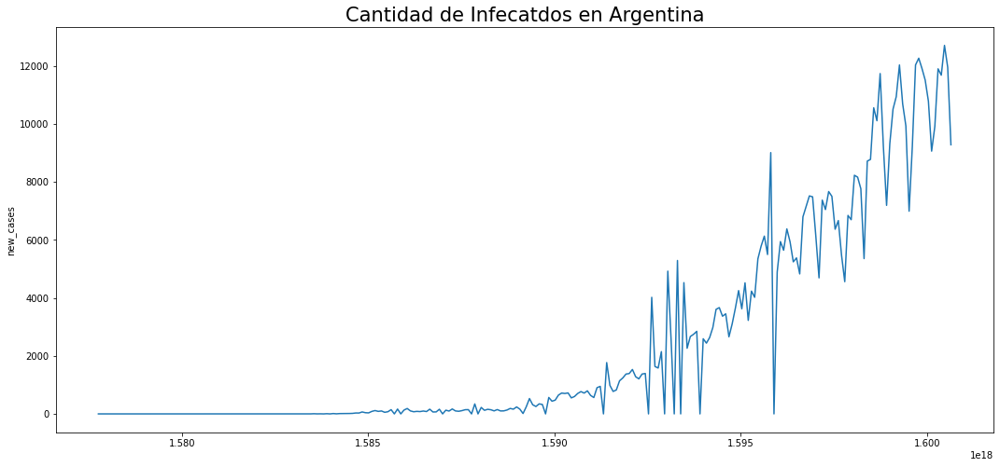

In [ ]:
plt.figure(figsize=(18,8))
sns.lineplot(y=new_df[new_df['iso_code'] == 'ARG']['new_cases'], 
             x = new_df['date'].unique().tolist())
plt.title('Cantidad de Infecatdos en Argentina', size=21)

Text(0.5, 0, 'Fecha')

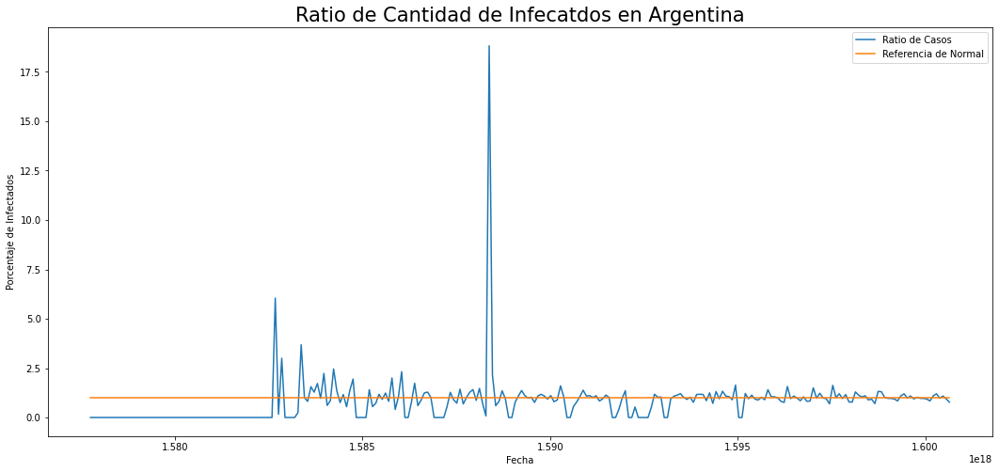

In [ ]:
plt.figure(figsize=(18,8))
sns.lineplot(y= new_df[new_df['iso_code'] == 'ARG']['ratio'], x = new_df['date'].unique().tolist(), markers=True, dashes=False)
sns.lineplot(x=new_df['date'].unique().tolist(), y = np.ones(len(new_df['date'].unique())))
plt.title('Ratio de Cantidad de Infecatdos en Argentina', size=21)
plt.legend(labels=['Ratio de Casos', 'Referencia de Normal'])
plt.ylabel('Porcentaje de Infectados')
plt.xlabel('Fecha')

(-0.1, 6.0)

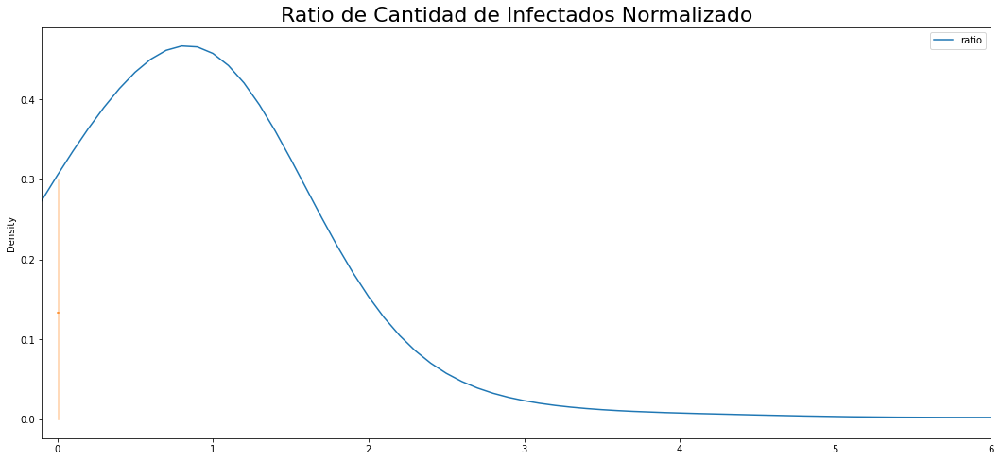

In [ ]:
# capas quede mas lindo ploteando ratio, ratio day, percent_nc, ..._day todo junto
new_df['ratio'].plot.kde(ind= np.arange(-5, 8, 0.1),figsize=(18,8))
sns.lineplot(x=[0, 0, 0, 0.01, 0.01, 0.01], y = [0, 0.1, 0.3, 0, 0.1, 0.3])
plt.title('Ratio de Cantidad de Infectados Normalizado', size=22)
plt.xlim([-0.1, 6])

Text(0.5, 1.0, 'Ratio Normalizada de Cantidad de Infectados')

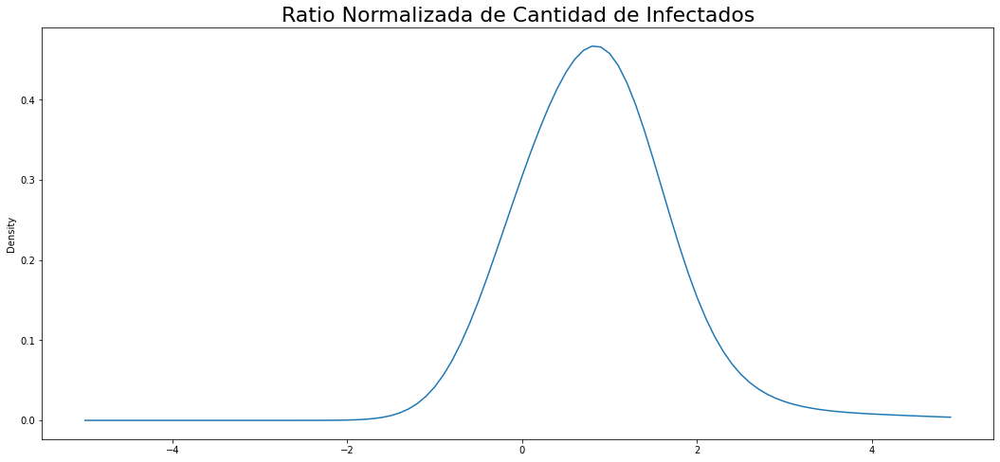

In [ ]:
new_df['ratio'].plot.kde(ind= np.arange(-5, 5, 0.1),figsize=(18,8))
plt.title('Ratio Normalizada de Cantidad de Infectados', size=22)

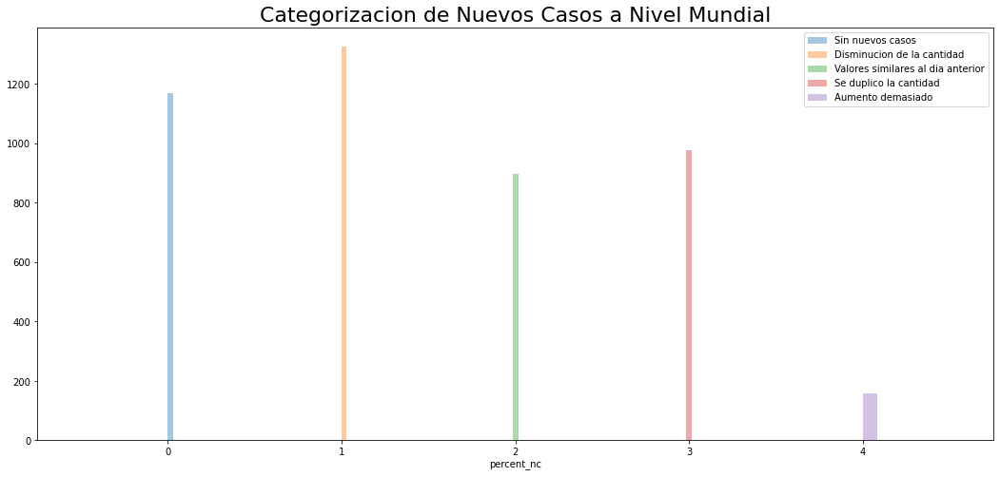

In [ ]:
plt.figure(figsize=(18,8))
sns.distplot(new_df[ new_df['percent_nc' ] == 0]['percent_nc'], kde=False)
sns.distplot(new_df[ new_df['percent_nc' ] == 1]['percent_nc'], kde=False)
sns.distplot(new_df[ new_df['percent_nc' ] == 2]['percent_nc'], kde=False)
sns.distplot(new_df[ new_df['percent_nc' ] == 3]['percent_nc'], kde=False)
sns.distplot(new_df[ new_df['percent_nc' ] == 4]['percent_nc'], kde=False)
plt.title('Categorizacion de Nuevos Casos a Nivel Mundial',size=22)
plt.legend(labels=['Sin nuevos casos', 'Disminucion de la cantidad', 'Valores similares al dia anterior','Se duplico la cantidad','Aumento demasiado'])

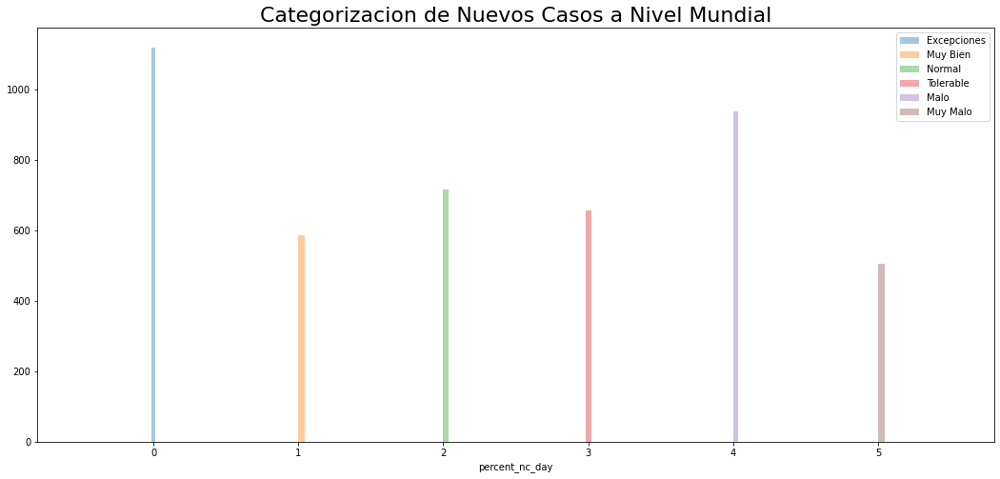

In [ ]:
plt.figure(figsize=(18,8))
sns.distplot(new_df[ new_df['percent_nc_day' ] == 0]['percent_nc_day'], kde=False)
sns.distplot(new_df[ new_df['percent_nc_day' ] == 1]['percent_nc_day'], kde=False)
sns.distplot(new_df[ new_df['percent_nc_day' ] == 2]['percent_nc_day'], kde=False)
sns.distplot(new_df[ new_df['percent_nc_day' ] == 3]['percent_nc_day'], kde=False)
sns.distplot(new_df[ new_df['percent_nc_day' ] == 4]['percent_nc_day'], kde=False)
sns.distplot(new_df[ new_df['percent_nc_day' ] == 5]['percent_nc_day'], kde=False)
plt.title('Categorizacion de Nuevos Casos a Nivel Mundial',size=22)
plt.legend(labels=['Excepciones', 'Muy Bien', 'Normal','Tolerable','Malo','Muy Malo'])

In [ ]:
new_df.sample(5)

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,new_tests,total_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,tests_per_case,positive_rate,tests_units,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,ratio,percent_nc,ratio_day,percent_nc_day
20996,ITA,Europe,Italy,2020-05-13,221216,1402,1171.857,30911,172,228.000,3658.771,23.188,19.382,511.248,2.845,3.771,37049.0,1778952.0,29.423,0.613,32723.0,0.541,27.924,0.036,people tested,62.96,60461828.0,205.859,47.9,23.021,16.240,35220.084,2.0,113.151,4.78,19.8,27.8,0.0,3.18,83.51,0.880,1.015634,2,0.006338,2
21767,JPN,Asia,Japan,2020-03-01,239,9,15.286,5,2,0.571,1.890,0.071,0.121,0.040,0.016,0.005,0.0,0.0,0.000,0.000,1154.0,0.009,75.495,0.013,tests performed,34.26,126476458.0,347.778,48.2,27.049,18.493,39002.223,0.0,79.370,5.72,11.2,33.7,0.0,13.05,84.63,0.909,2.072816,3,0.037566,4
20955,ITA,Europe,Italy,2020-04-02,110574,4782,5169.714,13157,727,807.429,1828.823,79.091,85.504,217.608,12.024,13.354,0.0,0.0,0.000,0.000,0.0,0.000,0.000,0.000,0,91.67,60461828.0,205.859,47.9,23.021,16.240,35220.084,2.0,113.151,4.78,19.8,27.8,0.0,3.18,83.51,0.880,1.188058,3,0.043247,4
2377,AUS,Oceania,Australia,2020-08-10,21084,386,451.571,295,17,12.429,826.827,15.137,17.709,11.569,0.667,0.487,61132.0,4918546.0,192.885,2.397,75948.0,2.978,168.186,0.006,tests performed,79.17,25499881.0,3.202,37.9,15.504,10.129,44648.710,0.5,107.791,5.07,13.0,16.5,0.0,3.84,83.44,0.939,1.264215,3,0.018307,3
2334,AUS,Oceania,Australia,2020-06-28,7641,46,29.286,104,0,0.286,299.648,1.804,1.148,4.078,0.000,0.011,43114.0,2379175.0,93.301,1.691,48264.0,1.893,1648.039,0.001,tests performed,52.31,25499881.0,3.202,37.9,15.504,10.129,44648.710,0.5,107.791,5.07,13.0,16.5,0.0,3.84,83.44,0.939,1.233389,3,0.006020,2


In [ ]:
def remove_date(df, init=61, finish=0):
  # el init indica cuanto se elimina, por defecto incluye el 31 de diciembre hasta 28 de enero.
  # osea que elimina todo hasta el 1 de marzo
  # si aumentas el 19 estas eliminando marzo
  # por ejemplo init = 50 eliminas el mes de marzo
  # finish elimina una cierta cantidad de valores
  dates = df['date'].unique().tolist()
  dates = [ datetime.datetime.fromtimestamp(date/1000000000) for date in dates ]
  dates.sort()
  dates_to_remove = dates[:init]

  if finish is not 0:
    for i in dates[-finish:]: 
      dates_to_remove.append(i)
  
  to_remove = []

  for i in range(len(df)):
    if df['date'].iloc[i] in dates_to_remove:
      to_remove.append(i)

  df.drop(df.index[to_remove], inplace=True)

  return df

In [ ]:
import datetime
finish = datetime.datetime.now() - datetime.datetime(2020, 8, 22)
new_df = remove_date(new_df, 0, finish.days)

In [ ]:
new_df.shape

(4012, 45)

In [ ]:
new_df = new_df.sort_values(by=['iso_code', 'date'])

### Build policies df


In [ ]:
dateparse = lambda x: pd.datetime.strptime(x, '%Y-%m-%d')

url = 'https://raw.githubusercontent.com/AgusVelez5/covid-tree/master/csv/measures_17_countries.csv'
df_policies = pd.read_csv(url, index_col=0, parse_dates=['date'], date_parser=dateparse)
df_policies.sample(5)

,iso_code,date,quarentine,mask,social_distance,level_event,local_fights,international_fights,level_tracing,borders,social_activiti
1733,FRA,2020-03-21,4,0,0,0,0,0,0,0,5
1441,ESP,2020-01-25,0,0,0,5,1,1,0,2,0
1887,FRA,2020-08-22,1,2,2,1,0,0,2,1,4
3092,NZL,2020-01-24,0,0,0,5,1,1,0,2,0
3495,PRY,2020-07-09,4,1,2,0,0,0,0,0,5


In [ ]:
df_policies.dtypes

iso_code                        object
date                    datetime64[ns]
quarentine                       int64
mask                             int64
social_distance                  int64
level_event                      int64
local_fights                     int64
international_fights             int64
level_tracing                    int64
borders                          int64
social_activiti                  int64
dtype: object

In [ ]:
df_policies = df_policies.rename(columns={'international_fights': 'international_flights', 'local_fights': 'local_flights', 'social_activiti': 'social_activity'})
df_policies.head()

,iso_code,date,quarentine,mask,social_distance,level_event,local_flights,international_flights,level_tracing,borders,social_activity
0,ARG,2019-12-31,0,0,0,5,1,1,0,2,0
1,ARG,2020-01-01,0,0,0,5,1,1,0,2,0
2,ARG,2020-01-02,0,0,0,5,1,1,0,2,0
3,ARG,2020-01-03,0,0,0,5,1,1,0,2,0
4,ARG,2020-01-04,0,0,0,5,1,1,0,2,0


In [ ]:
df_policies.level_event = df_policies.level_event.replace({0: 5, 1: 4, 2: 3, 3: 2, 4: 1, 5: 0})
df_policies.borders = df_policies.borders.replace({0: 2, 2: 0})
df_policies.sort_values(['iso_code','date'],inplace=True)
df_policies.head()

,iso_code,date,quarentine,mask,social_distance,level_event,local_flights,international_flights,level_tracing,borders,social_activity
0,ARG,2019-12-31,0,0,0,0,1,1,0,0,0
1,ARG,2020-01-01,0,0,0,0,1,1,0,0,0
2,ARG,2020-01-02,0,0,0,0,1,1,0,0,0
3,ARG,2020-01-03,0,0,0,0,1,1,0,0,0
4,ARG,2020-01-04,0,0,0,0,1,1,0,0,0


In [ ]:
Counter(df_policies['iso_code'])

Counter({'ARG': 236,
         'AUS': 236,
         'BRA': 236,
         'CAN': 236,
         'CHL': 236,
         'DEU': 236,
         'ESP': 236,
         'FRA': 236,
         'GBR': 236,
         'ITA': 236,
         'JPN': 236,
         'KOR': 236,
         'MEX': 236,
         'NZL': 236,
         'PRY': 236,
         'URY': 236,
         'USA': 236})

In [ ]:
Counter(new_df['iso_code'])

Counter({'ARG': 236,
         'AUS': 236,
         'BRA': 236,
         'CAN': 236,
         'CHL': 236,
         'DEU': 236,
         'ESP': 236,
         'FRA': 236,
         'GBR': 236,
         'ITA': 236,
         'JPN': 236,
         'KOR': 236,
         'MEX': 236,
         'NZL': 236,
         'PRY': 236,
         'URY': 236,
         'USA': 236})

# Interpretacion de los datos  
* `iso_code`: Código ISO del país
* `date`: Fecha
* `quarentine`: Cuarentena
  * 0: No se posee cuarentena.
  * 1: Se recomienda levemente.
  * 2: Se aplica en areas específicas.
  * 3: Se aplica en estados/provincias.
  * 4: Se aplica de manera nacional.
* `mask`: Barbijo
  * 0: No es obligatorio.
  * 1: Se recomienda usarlo.
  * 2: Es obligatorio.
* `social_distance`: Distanciamiento social
  * 0: No es obligatorio.
  * 1: Se recomienda aplicarlo.
  * 2: Es obligatorio.
* `level_event`: Cantidad de personas posibles por eventos
  * 0: Sin restricciones.
  * 1: No se permiten eventos masivos.
  * 2: Hasta 1000 personas.
  * 3: Hasta 100 personas.
  * 4: Hasta 10 personas.
  * 5: Completamente prohibidos.
* `local_fights`: Vuelos locales
  * 0: No
  * 1: Si
* `international_fight`: Vuelos internacionales
  * 0: No
  * 1: Si
* `level_tracing`: Seguimiento de casos y testeo
  * 0: Nulo seguimiento.
  * 1: Seguimiento voluntario con herramientas minimas del estado. 
  * 2: Seguimiento obligatorio con herramientas medias del estado.
  * 3: Seguimiento obligatorio con herramientas masivas del estado.
* `borders`: Apertura de fronteras
  * 0: Abiertas.
  * 1: Parciales.
  * 2: Cerradas.
* `social_activity`: Activiades económicas
  * 0: Actividades normales.
  * 1: Se recomienda no asistir a lugares muy concurridos.
  * 2: Se prohibien eventos multitudinarios.
  * 3: Se prohiben espacios cerrados multitudinarios.
  * 4: Se aplican protocolos de seguridad.
  * 5: Solo se permiten actividades necesarias.


#### Declarando Arbol de desición inicial

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.tree import plot_tree

param_dist = {
    'criterion': ['gini', 'entropy'],
    'max_depth': list(range(1, 15)),
    'max_features': list(range(1, 10)),
    'min_samples_split': [2, 3, 4, 5],
    'min_samples_leaf': [1, 2, 3, 4, 5]
}

tree = DecisionTreeClassifier(random_state=0)

#### Construcción Arbol de desición de países

In [ ]:
from sklearn.model_selection import train_test_split

X, y = df_policies.drop(['date', 'iso_code'], axis=1) , df_policies.iso_code

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state = 0)

(X_train.shape, X_test.shape), (y_train.shape, y_test.shape)

(((3009, 9), (1003, 9)), ((3009,), (1003,)))

In [ ]:
country_tree_cv = RandomizedSearchCV(tree, param_dist, n_iter=150, cv=10)

country_tree_cv.fit(X_train, y_train);

In [ ]:
best_country_tree = country_tree_cv.best_estimator_

In [ ]:
y_pred = best_country_tree.predict(X_test)

In [ ]:
from sklearn.metrics import accuracy_score

print("Accuracy:", accuracy_score(y_test, y_pred))

Accuracy: 0.6211365902293121


In [ ]:
df_policies.iso_code.unique()

array(['ARG', 'AUS', 'BRA', 'CAN', 'CHL', 'DEU', 'ESP', 'FRA', 'GBR',
       'ITA', 'JPN', 'KOR', 'MEX', 'NZL', 'PRY', 'URY', 'USA'],
      dtype=object)

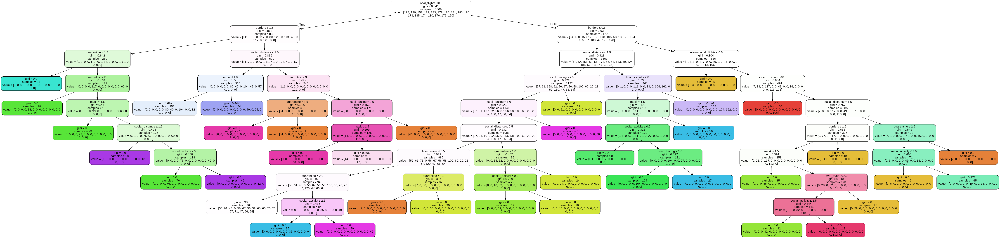

In [ ]:
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus

dot_data = StringIO()
export_graphviz(best_country_tree, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True, feature_names = X_test.columns)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

#### Construcción Arbol de desición de Indice de Infectados

##### Con respecto de la cantidad de infectados diariamente



In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.tree import plot_tree

param_dist = {
    'criterion': ['gini', 'entropy'],
    'max_depth': list(range(1, 15)),
    'max_features': list(range(1, 10)),
    'min_samples_split': [2, 3, 4, 5],
    'min_samples_leaf': [1, 2, 3, 4, 5]
}

tree = DecisionTreeClassifier(random_state=0)

In [ ]:
new_df.set_index(np.arange(len(new_df)),inplace=True)
df_policies.sort_values(['iso_code','date'],inplace=True)

In [ ]:
# si le agregamos population aumenta el nivel de entrenamiento y si le ponemos total_cases_per_million y new_cases_per_millon nos aumenta el nivel de prediccion
X, y = pd.merge(df_policies.drop(['date', 'iso_code'], axis=1), new_df[['total_tests_per_thousand','total_cases_per_million']] , left_index=True, right_index=True) , new_df.percent_nc_day

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state = 0)

(X_train.shape, X_test.shape), (y_train.shape, y_test.shape)

(((3009, 11), (1003, 11)), ((3009,), (1003,)))

In [ ]:
infected_tree_cv = RandomizedSearchCV(tree, param_dist, n_iter=50, cv=5)

infected_tree_cv.fit(X_train, y_train);

In [ ]:
best_infected_tree = infected_tree_cv.best_estimator_

In [ ]:
y_pred_train = best_infected_tree.predict(X_train)
y_pred = best_infected_tree.predict(X_test)

In [ ]:
print("Accuracy train:", accuracy_score(y_train, y_pred_train))

Accuracy train: 0.8594217347956131


In [ ]:
print("Accuracy:", accuracy_score(y_test, y_pred))

Accuracy: 0.7666999002991027


In [ ]:
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus

dot_data = StringIO()
export_graphviz(best_infected_tree, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True, feature_names = X_test.columns)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.811285 to fit



##### Con respecto de los datos del dia de hoy podemos predecir los datos que podriamos llegar a tener en 15 dias

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.tree import plot_tree

param_dist = {
    'criterion': ['gini', 'entropy'],
    'max_depth': list(range(1, 15)),
    'max_features': list(range(1, 10)),
    'min_samples_split': [2, 3, 4, 5],
    'min_samples_leaf': [1, 2, 3, 4, 5]
}

tree = DecisionTreeClassifier(random_state=0)

In [ ]:
X, y = pd.merge(df_policies.drop(['date', 'iso_code'], axis=1),new_df[['total_tests_per_thousand', 'population', 'total_cases_per_million', 'new_cases_per_million']], left_index=True, right_index=True) , new_df.percent_nc

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state = 0)

infected_tree_cv = RandomizedSearchCV(tree, param_dist, n_iter=50, cv=5)

infected_tree_cv.fit(X_train, y_train)

best_infected_tree = infected_tree_cv.best_estimator_

y_pred_train = best_infected_tree.predict(X_train)

y_pred = best_infected_tree.predict(X_test)

print("Accuracy train:", accuracy_score(y_train, y_pred_train))

print("Accuracy:", accuracy_score(y_test, y_pred))

Accuracy train: 0.5191093386507145
Accuracy: 0.5124626121635095


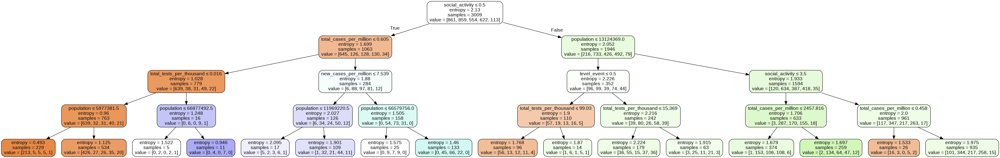

In [ ]:
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus

dot_data = StringIO()
export_graphviz(best_infected_tree, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True, feature_names = X_test.columns)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

### Seleccion de politicas


In [ ]:
policies_dict = {"Cuarentena" : list(range(0, 5)), 
                 "Barbijo" : list(range(0, 3)), 
                 "Distanciamiento social" : list(range(0, 3)), 
                 "Cantidad de personas posibles por eventos" : list(range(0, 5)), 
                 "Vuelos locales" : list(range(0, 2)), 
                 "Vuelos internacionales" : list(range(0, 2)), 
                 "Seguimiento de casos y testeo" : list(range(0, 4)), 
                 "Apertura de fronteras" : list(range(0, 3)), 
                 "Actividad economica" : list(range(0, 6))}

policies_names = list(policies_dict.keys())

policy = []
breaked = False

for key in policies_names:
  values = policies_dict[key]
  try:
    policy.append(int(input(f"{key}? {str(values[0]) + '-' + str(values[-1])} \n")))
  except:
    print(f"La politica {key} acepta valores del {str(values[0]) + '-' + str(values[-1])} \n")
    breaked = True
    break

policies_values_dicts = [
      {
          "0": "No se posee cuarentena.",
          "1": "Se recomienda levemente.",
          "2": "Se aplica en areas específicas.",
          "3": "Se aplica en estados/provincias.",
          "4": "Se aplica de manera nacional."
      },
      {
          "0": "No es obligatorio.",
          "1": "Se recomienda usarlo.",
          "2": "Es obligatorio."
      },
      {
          "0": "No es obligatorio.",
          "1": "Se recomienda aplicarlo.",
          "2": "Es obligatorio."
      },
      {
          "0": "Sin restricciones.",
          "1": "No se permiten eventos masivos.",
          "2": "Hasta 1000 personas.",
          "3": "Hasta 100 personas.",
          "4": "Hasta 10 personas.",
          "5": "Completamente prohibidos."
      },
      {
          "0": "No",
          "1": "Si"
      },
      {
          "0": "No",
          "1": "Si"
      },
      {
          "0": "Nulo seguimiento.",
          "1": "Seguimiento voluntario con herramientas minimas del estado.",
          "2": "Seguimiento obligatorio con herramientas medias del estado.",
          "3": "Seguimiento obligatorio con herramientas masivas del estado."
      },
      {
          "0": "Abiertas.",
          "1": "Parciales.",
          "2": "Cerradas."
      },
      {
          "0": "Actividades normales.",
          "1": "Se recomienda no asistir a lugares muy concurridos.",
          "2": "Se prohibien eventos multitudinarios.",
          "3": "Se prohiben espacios cerrados multitudinarios.",
          "4": "Se aplican protocolos de seguridad.",
          "5": "Solo se permiten actividades necesarias."
      }
]

policies_descriptions = []

if breaked == False:
  for i in range(len(policy)):
    try:
      policies_descriptions.append(policies_values_dicts[i][str(policy[i])])
    except:
      values = policies_dict[policies_names[i]]
      print(f"No se acepta el valor {policy[i]} en {policies_names[i]} solo valores del {str(values[0]) + ' al ' + str(values[-1])}")
      breaked = True
      break

  if breaked == False:
    data_df = {'Desicion': policy, 'Politica': policies_names, 'Descripcion':  policies_descriptions}
    df_decision =  pd.DataFrame(data=data_df)
    display(df_decision)

Cuarentena? 0-4 
7
Barbijo? 0-2 

La politica Barbijo acepta valores del 0-2 



In [ ]:
df_polices = remove_date(df_policies)
new_df = remove_date(new_df)

In [ ]:
def newCasesCode(codes = ['ARG']):
  plt.figure(figsize=(10, 6))
  for code in codes:
    params = (new_df.iso_code == code)
    name = new_df[params].location.unique()[-1]
    sns.distplot(new_df[params].new_cases, label=name)
  plt.legend()
  plt.title('Histograma nuevos casos')

def newDeathsCode(codes = ['ARG']):
  plt.figure(figsize=(10, 6))
  for code in codes:
    params = (new_df.iso_code == code)
    name = new_df[params].location.unique()[-1]
    sns.distplot(new_df[params].new_deaths, label=name, color="red")
  plt.legend()
  plt.title('Histograma nuevos decesos')

def cases_and_deathsCode(codes = ['ARG', 'MEX']):
  if len(codes) < 2 or len(codes) > 3:
    return print('Entre 2 o 3 paises')
  fig, axes = plt.subplots(len(codes), 2, figsize=(13, 13))
  sns.despine(left=True)
  row = 0
  for code in codes:
    for column in range(2): 
      params = (new_df.iso_code == code)
      name = new_df[params].location.unique()[-1]
      if column == 1:
        sns.distplot(new_df[params].new_deaths, ax=axes[row, column])
        axes[row, column].title.set_text('Muertes ' + str(name))
      else:
        sns.distplot(new_df[params].new_cases, ax=axes[row, column])
        axes[row, column].title.set_text('Casos ' + str(name))
      axes[row, column].set_ylabel('')
      axes[row, column].set_xlabel('')
      if column == 1:
          row+=1

def newCasesLPCode(codes = ['ARG']):
  plt.figure(figsize=(10, 6))
  for code in codes:
    params = (new_df.iso_code == code)
    name = new_df[params].location.unique()[-1]
    sns.lineplot(new_df.date, new_df[params].new_cases, label=name)
  plt.title('Nuevos casos')
  plt.ylabel('Casos')
  plt.xlabel('Fecha')
  plt.tick_params(
    axis='x',          
    which='both',      
    bottom=False,      
    top=False,         
    labelbottom=False)
  plt.legend()
  plt.show()

def newDeathsLPCode(codes = ['ARG']):
  plt.figure(figsize=(10, 6))
  for code in codes:
    params = (new_df.iso_code == code)
    name = new_df[params].location.unique()[-1]
    sns.lineplot(new_df.date, new_df[params].new_deaths, label=name, color="red")
  plt.title('Decesos nuevos')
  plt.ylabel('Decesos')
  plt.xlabel('Fecha')
  plt.tick_params(
    axis='x',          
    which='both',      
    bottom=False,      
    top=False,         
    labelbottom=False)
  plt.legend()
  plt.show()

def totalCasesLPCode(codes = ['ARG']):
  plt.figure(figsize=(10, 6))
  for code in codes:
    params = (new_df.iso_code == code)
    name = new_df[params].location.unique()[-1]
    sns.lineplot(new_df.date, new_df[params].total_cases, label=name)
  plt.title('Casos totales')
  plt.ylabel('Casos')
  plt.xlabel('Fecha')
  plt.tick_params(
    axis='x',          
    which='both',      
    bottom=False,      
    top=False,         
    labelbottom=False)
  plt.legend()
  plt.show()

def totalDeathsLPCode(codes = ['ARG']):
  plt.figure(figsize=(10, 6))
  for code in codes:
    params = (new_df.iso_code == code)
    name = new_df[params].location.unique()[-1]
    sns.lineplot(new_df.date, new_df[params].total_deaths, label=name, color="red")
  plt.title('Decesos Totales')
  plt.ylabel('Decesos')
  plt.xlabel('Fecha')
  plt.tick_params(
    axis='x',          
    which='both',      
    bottom=False,      
    top=False,         
    labelbottom=False)
  plt.legend()
  plt.show()

def totalCDTLPCode(codes = ['ARG']):
  plt.figure(figsize=(10, 6))
  for code in codes:
    params = (new_df.iso_code == code)
    name = new_df[params].location.unique()[-1]
    sns.lineplot(new_df.date, new_df[params].total_cases, label= "Casos " + str(name))
    sns.lineplot(new_df.date, new_df[params].total_deaths, label="Decesos " + str(name), color="red")
    sns.lineplot(new_df.date, new_df[params].total_tests, label="Tests " + str(name), color="green")
  plt.title('Casos, decesos y test totales')
  plt.ylabel('Cantidad')
  plt.xlabel('Fecha')
  plt.tick_params(
    axis='x',          
    which='both',      
    bottom=False,      
    top=False,         
    labelbottom=False)
  plt.legend()
  plt.show()

def totalCDTLPLogCode(codes = ['ARG']):
  plt.figure(figsize=(10, 6))
  for code in codes:
    params = (new_df.iso_code == code)
    name = new_df[params].location.unique()[-1]
    sns.lineplot(new_df.date, np.log(new_df[params].total_cases), label= "Casos " + str(name))
    sns.lineplot(new_df.date, np.log(new_df[params].total_deaths), label="Decesos " + str(name), color="red")
    sns.lineplot(new_df.date, np.log(new_df[params].total_tests), label="Tests " + str(name), color="green")
  plt.title('Casos, decesos y test totales formato logaritmico')
  plt.ylabel('Cantidad')
  plt.xlabel('Fecha')
  plt.tick_params(
    axis='x',          
    which='both',      
    bottom=False,      
    top=False,         
    labelbottom=False)
  plt.legend()
  plt.show()

def positiveRateLPCode(codes = ['ARG']):
  plt.figure(figsize=(10, 6))
  for code in codes:
    params = (new_df.iso_code == code)
    name = new_df[params].location.unique()[-1]
    sns.lineplot(new_df.date, new_df[params].positive_rate, label="Ratio de positivos " + str(name))
  plt.title('Ratio de positivos')
  plt.ylabel('Cantidad')
  plt.xlabel('Fecha')
  plt.tick_params(
    axis='x',          
    which='both',      
    bottom=False,      
    top=False,         
    labelbottom=False)
  plt.legend()
  plt.show()


In [ ]:
result_country = best_country_tree.predict([policy])
result_infected = best_infected_tree.predict([policy])

name = new_df[new_df.iso_code == result_country[0]].location.unique()[-1]
print("País resultante " + name)

ValueError: ignored

In [ ]:
desc = new_df[new_df.iso_code == result_country[0]].describe()
filter_col = desc[['new_cases', 'total_cases', 'new_deaths', 'total_deaths', 'new_tests', 'total_tests', 'population', 'positive_rate', 'median_age', 'aged_70_older']]
renamed_col = {'new_cases': "Nuevos casos",
               "total_cases": "Casos totales", 
               'new_deaths': "Nuevos decesos",
               'total_deaths': "Decesos totales", 
               'new_tests': "Nuevos test", 
               'total_tests': "Test totales", 
               'positive_rate': "Tasa positiva", 
               'population': "Población", 
               'median_age': "Edad media", 
               'aged_70_older': "Mayores a 70"}
renamed = filter_col.rename(columns=renamed_col)
filter_row = renamed.loc[['mean', 'std', 'min', '25%', '50%', '75%', 'max']]
filter_row.rename({"mean": "Media", "std": "Std", "min": "Min", "max": "Max"})

In [ ]:
newCasesCode(result_country)

In [ ]:
newDeathsCode(result_country)

In [ ]:
totalCasesLPCode(result_country)

In [ ]:
totalDeathsLPCode(result_country)

In [ ]:
totalCDTLPCode(result_country)

In [ ]:
totalCDTLPLogCode(result_country)

In [ ]:
positiveRateLPCode(result_country)

In [ ]:
df_polices.sample(10)

### Mundo

In [ ]:
fig = px.scatter_geo(full_grouped, lat=full_grouped.columns[3], lon=full_grouped.columns[4], 
                     color= full_grouped.columns[5], text=full_grouped.columns[2],
                     hover_name=full_grouped.columns[2], size=full_grouped.columns[5],
                     #animation_frame=full_grouped.columns[5],
                     animation_group=full_grouped.columns[5],
                     projection='natural earth',
                     title='Casos confirmados en el mundo')
fig.show()

In [ ]:
fig = px.scatter_geo(full_grouped, lat=full_grouped.columns[3], lon=full_grouped.columns[4], 
                     color= full_grouped.columns[6], text=full_grouped.columns[2],
                     hover_name=full_grouped.columns[2], size=full_grouped.columns[6],
                     #animation_frame=full_grouped.columns[6],
                     animation_group=full_grouped.columns[6],
                     projection='natural earth',
                     title='Decesos en el mundo')
fig.show()

In [ ]:
fig = px.scatter_geo(full_grouped, lat=full_grouped.columns[3], lon=full_grouped.columns[4], 
                     color= 'Fatality_rate', text=full_grouped.columns[2],
                     hover_name=full_grouped.columns[2], size='Fatality_rate',
                     #animation_frame='fatality_rate',
                     animation_group='Fatality_rate',
                     projection='natural earth',
                     title='Tasa de fatalidad (%)')
fig.show()

In [ ]:
fig = px.scatter_geo(full_grouped, lat=full_grouped.columns[3], lon=full_grouped.columns[4], 
                     color= 'Infection_rate', text=full_grouped.columns[2],
                     hover_name=full_grouped.columns[2], size='Infection_rate',
                     #animation_frame='fatality_rate',
                     animation_group='Infection_rate',
                     projection='natural earth',
                     title='Tasa de infección por 1000')
fig.show()

In [ ]:
fig = px.scatter_geo(full_grouped, lat=full_grouped.columns[3], lon=full_grouped.columns[4], 
                     color= 'Mortality_rate', text=full_grouped.columns[2],
                     hover_name=full_grouped.columns[2], size='Mortality_rate',
                     #animation_frame='fatality_rate',
                     animation_group='Mortality_rate',
                     projection='natural earth',
                     title='Tasa de mortalidad por 1000')
fig.show()